In [ ]:
!git clone https://github.com/z4nix/modelingRecurrentGemma.git

Cloning into 'modelingRecurrentGemma'...
remote: Enumerating objects: 194380, done.
remote: Counting objects: 100% (21/21), done.
remote: Compressing objects: 100% (18/18), done.
remote: Total 194380 (delta 10), reused 2 (delta 0), pack-reused 194359 (from 1)
Receiving objects: 100% (194380/194380), 220.82 MiB | 35.05 MiB/s, done.
Resolving deltas: 100% (139953/139953), done.


In [ ]:
!cd /content/modelingRecurrentGemma/ && pip install -e .

Obtaining file:///content/modelingRecurrentGemma
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
  Building editable for transformers (pyproject.toml) ... done
  Created wheel for transformers: filename=transformers-4.46.0.dev0-0.editable-py3-none-any.whl size=17394 sha256=0c0d9165c1060f2bdfb8a292ca37da37ab0c49971b0d7295356eaf30daeb0627
  Stored in directory: /tmp/pip-ephem-wheel-cache-wfz3v7b7/wheels/bc/69/39/74eef301b64247fd934b768d60cd067e4e12710da00ac0944a
Successfully built transformers
  Attempting uninstall: transformers
    Found existing installation: transformers 4.46.2
    Uninstalling transformers-4.46.2:
      Successfully uninstalled transformers-4.46.2


Load Weights

In [ ]:
#Restart session if transformers cant be found
import os
os.kill(os.getpid(), 9)

In [ ]:
%cd /content/modelingRecurrentGemma/
from transformers import RecurrentGemmaConfig
config = RecurrentGemmaConfig.from_pretrained("google/recurrentgemma-2b")



/content/modelingRecurrentGemma


config.json:   0%|          | 0.00/875 [00:00<?, ?B/s]

In [ ]:
from transformers import RecurrentGemmaForCausalLM
model = RecurrentGemmaForCausalLM.from_pretrained("google/recurrentgemma-2b")
model.save_pretrained("/content/modelingRecurrentGemma/src/transformers/models/recurrent_gemma")


/usr/local/lib/python3.10/dist-packages/torch_xla/__init__.py:253: UserWarning: `tensorflow` can conflict with `torch-xla`. Prefer `tensorflow-cpu` when using PyTorch/XLA. To silence this warning, `pip uninstall -y tensorflow && pip install tensorflow-cpu`. If you are in a notebook environment such as Colab or Kaggle, restart your notebook runtime afterwards.
  warnings.warn(


model.safetensors.index.json:   0%|          | 0.00/42.8k [00:00<?, ?B/s]

model-00001-of-00003.safetensors:   0%|          | 0.00/4.97G [00:00<?, ?B/s]

model-00002-of-00003.safetensors:   0%|          | 0.00/4.96G [00:00<?, ?B/s]

model-00003-of-00003.safetensors:   0%|          | 0.00/797M [00:00<?, ?B/s]

Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/137 [00:00<?, ?B/s]

Main code

In [ ]:
!pip install transformers datasets torch

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.7/67.7 kB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 480.6/480.6 kB 12.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.3/179.3 kB 11.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 43.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 8.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 11.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 241.9/241.9 kB 12.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 124.6/124.6 kB 8.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 208.9/208.9 kB 14.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 319.4/319.4 kB 18.0 MB/s eta 0:00:00
  Attempting uninstall: fsspec
    Found existing installation: fsspec 2024.10.0
    Uninstalling fsspec-2024.10.0:
 

In [ ]:
import torch
from transformers import AutoTokenizer
from datasets import load_dataset
from transformers import RecurrentGemmaConfig, RecurrentGemmaForCausalLM
from transformers.models.recurrent_gemma.modeling_recurrent_gemma import * # Import all RecurrentGemma layers

# Load model and tokenizer
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
tokenizer = AutoTokenizer.from_pretrained("google/recurrentgemma-2b")
model = RecurrentGemmaForCausalLM.from_pretrained("/content/modelingRecurrentGemma/src/transformers/models/recurrent_gemma").to(device)

# Load WikiText dataset
dataset = load_dataset("wikitext", "wikitext-2-raw-v1", split="test")  # Load the 'test' split for inference
dataset = dataset.shuffle(seed=42).select(range(int(0.01 * len(dataset))))  # Select 20% of the dataset

# Tokenize the data
def tokenize_function(examples):
    return tokenizer(examples["text"], truncation=True, padding="max_length", max_length=128)

tokenized_dataset = dataset.map(tokenize_function, batched=True)

# Convert the tokenized dataset to PyTorch tensors
tokenized_dataset.set_format(type='torch', columns=['input_ids', 'attention_mask'])

# Prepare dataloader for batched inference
dataloader = torch.utils.data.DataLoader(tokenized_dataset, batch_size=8)

# # Move model to CUDA if available
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# model.to(device)




tokenizer_config.json:   0%|          | 0.00/46.4k [00:00<?, ?B/s]

tokenizer.model:   0%|          | 0.00/4.24M [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/17.5M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/636 [00:00<?, ?B/s]

Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

README.md:   0%|          | 0.00/10.5k [00:00<?, ?B/s]

test-00000-of-00001.parquet:   0%|          | 0.00/733k [00:00<?, ?B/s]

train-00000-of-00001.parquet:   0%|          | 0.00/6.36M [00:00<?, ?B/s]

validation-00000-of-00001.parquet:   0%|          | 0.00/657k [00:00<?, ?B/s]

Generating test split:   0%|          | 0/4358 [00:00<?, ? examples/s]

Generating train split:   0%|          | 0/36718 [00:00<?, ? examples/s]

Generating validation split:   0%|          | 0/3760 [00:00<?, ? examples/s]

Map:   0%|          | 0/43 [00:00<?, ? examples/s]

###Old

In [ ]:
#old
import torch
import gc
from collections import defaultdict

all_stats = defaultdict(lambda: defaultdict(list))  # Dictionary to store stats per module name and batch

with torch.no_grad():  # Disable gradient calculation for inference
    # Loop over the entire dataset using the dataloader
    for i, batch in enumerate(dataloader):

        input_ids = batch['input_ids'].to(device)
        attention_mask = batch['attention_mask'].to(device)
        print(f"Batch {i + 1}: input_ids shape = {input_ids.shape}")

        # Run the model on the batch
        outputs = model(input_ids, attention_mask=attention_mask)

        # Access and accumulate recorder stats from all layers
        for name, module in model.named_modules():
            if isinstance(module, RecurrentGemmaRMSNorm):
                recorder = module.recorder

                # Capture statistics if any have been recorded
                if recorder.n_samples > 0:
                    stats = {
                        "n_samples": recorder.n_samples,
                        "min_per_channel": recorder.min_per_channel.cpu().numpy(),
                        "max_per_channel": recorder.max_per_channel.cpu().numpy(),
                        "mean_per_channel": recorder.mean_per_channel.cpu().numpy(),
                        "std_per_channel": recorder.std_per_channel.cpu().numpy(),
                        "outliers_per_channel": recorder.outliers_per_channel.cpu().numpy()
                    }

                    # Append the stats for the current batch to the correct layer in all_stats
                    all_stats[name]["n_samples"].append(stats["n_samples"])
                    all_stats[name]["min_per_channel"].append(stats["min_per_channel"])
                    all_stats[name]["max_per_channel"].append(stats["max_per_channel"])
                    all_stats[name]["mean_per_channel"].append(stats["mean_per_channel"])
                    all_stats[name]["std_per_channel"].append(stats["std_per_channel"])
                    all_stats[name]["outliers_per_channel"].append(stats["outliers_per_channel"])

        # Clear cache and memory
        del input_ids, attention_mask, outputs
        torch.cuda.empty_cache()  # Clear GPU cache
        gc.collect()  # Free unused memory

# Print the results at the end
for layer_name, stats in all_stats.items():
    print(f"Layer: {layer_name}")
    for stat_name, values in stats.items():
        print(f"  {stat_name}:")
        for batch_idx, batch_value in enumerate(values):
            print(f"    Batch {batch_idx + 1}: {batch_value}")
    print("-" * 40)


Batch 1: input_ids shape = torch.Size([8, 128])
Batch 2: input_ids shape = torch.Size([8, 128])
Batch 3: input_ids shape = torch.Size([8, 128])
Batch 4: input_ids shape = torch.Size([8, 128])
Batch 5: input_ids shape = torch.Size([8, 128])
Batch 6: input_ids shape = torch.Size([3, 128])
Layer: model.layers.0.temporal_pre_norm
  n_samples:
    Batch 1: 1
    Batch 2: 2
    Batch 3: 3
    Batch 4: 4
    Batch 5: 5
    Batch 6: 6
  min_per_channel:
    Batch 1: [-17.359375 -17.359375  -8.334473 ... -37.085938 -10.997559 -12.329102]
    Batch 2: [-17.359375 -18.049805  -9.370117 ... -37.085938 -10.997559 -12.329102]
    Batch 3: [-17.359375 -18.049805  -9.715332 ... -37.085938 -10.997559 -12.329102]
    Batch 4: [-17.359375 -18.049805  -9.715332 ... -37.085938 -12.378418 -12.329102]
    Batch 5: [-17.359375 -18.049805  -9.715332 ... -37.085938 -13.019531 -15.189453]
    Batch 6: [-17.359375 -18.049805  -9.715332 ... -37.085938 -13.019531 -15.189453]
  max_per_channel:
    Batch 1: [11.6386

<ipython-input-10-2b16941b8c05>:67: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  fig.colorbar(mappable, shrink=0.5, aspect=5, label='Mean Activation Value')


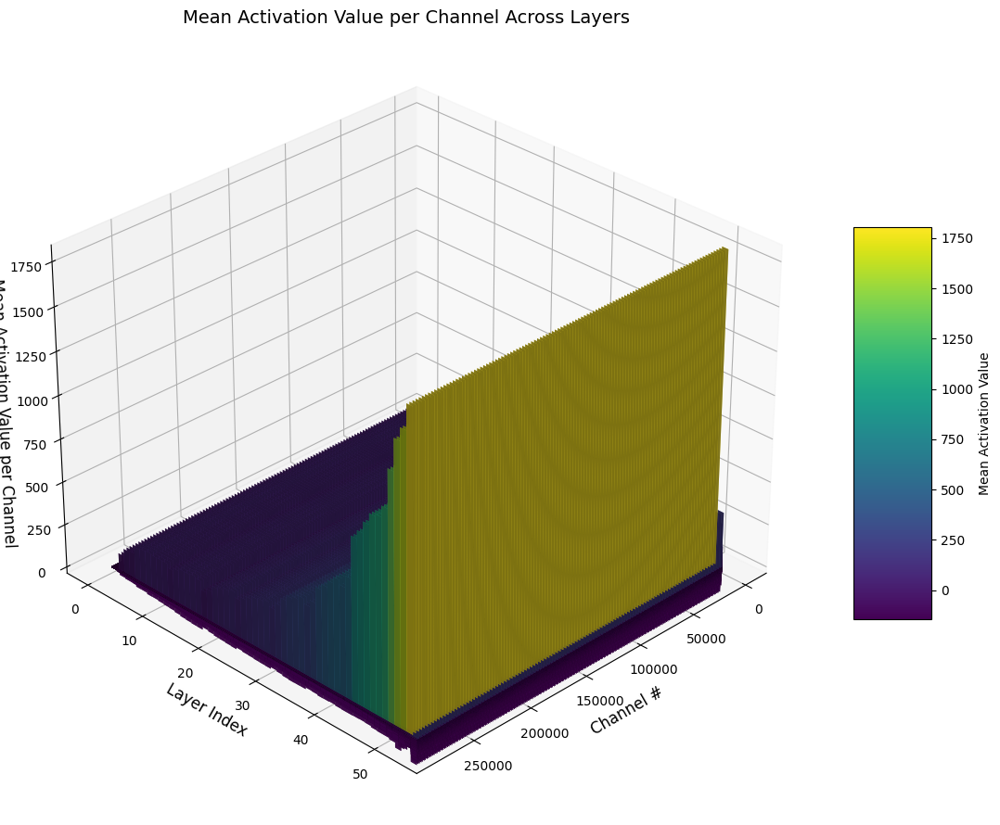

In [ ]:
#old
import torch
import gc
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from collections import defaultdict

# Assuming you have already run your model inference code and filled `all_stats`

# Create lists to store data for plotting
layer_indices = []
channels = []
means = []

# Loop over all accumulated stats in the dictionary
for layer_idx, (layer_name, stats) in enumerate(all_stats.items()):
    mean_per_channel_agg = []

    # `stats['mean_per_channel']` is a list of mean activations per batch, we flatten this to aggregate all batches
    for batch_means in stats['mean_per_channel']:  # Loop over each batch's mean_per_channel
        mean_per_channel_agg.extend(batch_means)  # Gather means for all channels in this layer across batches

    num_channels = len(mean_per_channel_agg)  # Number of channels in this layer

    # Append stats to lists for plotting
    layer_indices.extend([layer_idx] * num_channels)  # Store the layer index for each channel
    channels.extend(range(num_channels))  # Store channel indices
    means.extend(mean_per_channel_agg)  # Store the mean values for each channel

# Convert lists into numpy arrays for easier manipulation
layer_indices = np.array(layer_indices)
channels = np.array(channels)
means = np.array(means)

# Create a 3D bar plot
fig = plt.figure(figsize=(12, 9))
ax = fig.add_subplot(111, projection='3d')

# Define bar dimensions
xpos = channels  # Channel index
ypos = layer_indices  # Layer index
zpos = np.zeros_like(means)  # Start all bars at z=0

# Define the bar sizes (dx, dy, dz)
dx = np.ones_like(means)  # Width of the bars
dy = np.ones_like(means)  # Depth of the bars
dz = means  # Height of the bars, which represent the mean per channel

# Color gradient based on dz
colors = plt.cm.viridis(dz / np.max(dz))  # Normalize dz for color scaling

# Plot 3D bars with color gradient and transparency
ax.bar3d(xpos, ypos, zpos, dx, dy, dz, color=colors, alpha=0.8)

# Labeling and formatting
ax.set_xlabel('Channel #', fontsize=12)
ax.set_ylabel('Layer Index', fontsize=12)
ax.set_zlabel('Mean Activation Value per Channel', fontsize=12)
ax.set_title('Mean Activation Value per Channel Across Layers', fontsize=14)

# Rotate view for better visibility
ax.view_init(elev=30, azim=45)

# Add a color bar to explain the color mapping
mappable = plt.cm.ScalarMappable(cmap='viridis')
mappable.set_array(means)
fig.colorbar(mappable, shrink=0.5, aspect=5, label='Mean Activation Value')

plt.tight_layout()
plt.show()


In [ ]:
  import torch
  import gc
  from collections import defaultdict
  import numpy as np

  all_stats = defaultdict(lambda: defaultdict(list))  # Dictionary to store stats per layer and batch

  def move_and_append(recorder, layer_stats, prefix):
      # Collect all statistics from the recorder at once and move to CPU only once to reduce overhead
      stats = {
          f"{prefix}_n_samples": recorder.n_samples,
          f"{prefix}_min_per_channel": recorder.min_per_channel.cpu().numpy(),
          f"{prefix}_max_per_channel": recorder.max_per_channel.cpu().numpy(),
          f"{prefix}_mean_per_channel": recorder.mean_per_channel.cpu().numpy(),
          f"{prefix}_std_per_channel": recorder.std_per_channel.cpu().numpy(),
          f"{prefix}_outliers_per_channel": recorder.outliers_per_channel.cpu().numpy(),
      }
      for key, value in stats.items():
          layer_stats[key].append(value)

  with torch.no_grad():  # Disable gradient calculation for inference
      # Loop over the entire dataset using the dataloader
      for i, batch in enumerate(dataloader):
          input_ids = batch['input_ids'].to(device)
          attention_mask = batch['attention_mask'].to(device)
          print(f"Batch {i + 1}: input_ids shape = {input_ids.shape}")

          # Run the model on the batch
          outputs = model(input_ids, attention_mask=attention_mask)

          # Access and accumulate recorder stats from each layer
          for idx, layer in enumerate(model.model.layers):
              layer_stats = all_stats[f"layer_{idx}"]

              # Collect temporal statistics
              move_and_append(layer.temporal_pre_norm.recorder, layer_stats, "temporal")

              # Collect channel statistics
              move_and_append(layer.channel_pre_norm.recorder, layer_stats, "channel")

          # Clear cache and memory
          del input_ids, attention_mask, outputs
          torch.cuda.empty_cache()  # Clear GPU cache
          gc.collect()  # Free unused memory

  # Print the results at the end
  for layer_name, stats in all_stats.items():
      print(f"Layer: {layer_name}")
      for stat_name, values in stats.items():
          print(f"  {stat_name}: {values}")
      print("-" * 40)


Batch 1: input_ids shape = torch.Size([8, 128])
Batch 2: input_ids shape = torch.Size([8, 128])
Batch 3: input_ids shape = torch.Size([8, 128])
Batch 4: input_ids shape = torch.Size([8, 128])
Batch 5: input_ids shape = torch.Size([8, 128])
Batch 6: input_ids shape = torch.Size([3, 128])
Layer: layer_0
  temporal_n_samples: [7, 8, 9, 10, 11, 12]
  temporal_min_per_channel: [array([-17.359375, -18.049805,  -9.715332, ..., -37.085938, -13.019531,
       -15.189453], dtype=float32), array([-17.359375, -18.049805,  -9.715332, ..., -37.085938, -13.019531,
       -15.189453], dtype=float32), array([-17.359375, -18.049805,  -9.715332, ..., -37.085938, -13.019531,
       -15.189453], dtype=float32), array([-17.359375, -18.049805,  -9.715332, ..., -37.085938, -13.019531,
       -15.189453], dtype=float32), array([-17.359375, -18.049805,  -9.715332, ..., -37.085938, -13.019531,
       -15.189453], dtype=float32), array([-17.359375, -18.049805,  -9.715332, ..., -37.085938, -13.019531,
       -15.1

Processing Batch 1: Shape = torch.Size([8, 128])
Processing Batch 2: Shape = torch.Size([8, 128])
Processing Batch 3: Shape = torch.Size([8, 128])
Processing Batch 4: Shape = torch.Size([8, 128])
Processing Batch 5: Shape = torch.Size([8, 128])
Processing Batch 6: Shape = torch.Size([3, 128])


ValueError: Unable to determine Axes to steal space for Colorbar. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.

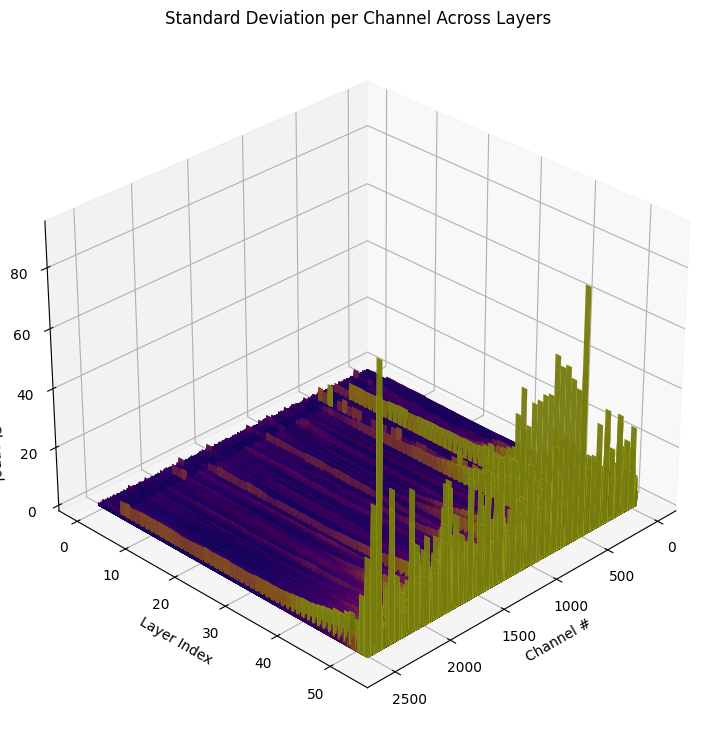

In [ ]:
#old but working
import torch
import gc
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from collections import defaultdict

# Initialize dictionary to store only essential stats
all_stats = defaultdict(lambda: defaultdict(list))

with torch.no_grad():
    for i, batch in enumerate(dataloader):
        input_ids = batch['input_ids'].to(device)
        attention_mask = batch['attention_mask'].to(device)
        print(f"Processing Batch {i + 1}: Shape = {input_ids.shape}")

        # Model inference
        outputs = model(input_ids, attention_mask=attention_mask)

        for name, module in model.named_modules():
            if isinstance(module, RecurrentGemmaRMSNorm):
                recorder = module.recorder
                if recorder.n_samples > 0:
                    # Only record std and outlier data for efficiency
                    stats = {
                        "std_per_channel": recorder.std_per_channel.cpu().numpy(),
                        "outliers_per_channel": recorder.outliers_per_channel.cpu().numpy()
                    }
                    all_stats[name]["std_per_channel"].append(stats["std_per_channel"])
                    all_stats[name]["outliers_per_channel"].append(stats["outliers_per_channel"])

        # Clear memory after each batch
        del input_ids, attention_mask, outputs
        torch.cuda.empty_cache()
        gc.collect()

# Prepare data for plotting
layer_indices, channels, std_devs = [], [], []
for layer_idx, (layer_name, stats) in enumerate(all_stats.items()):
    for batch_stds in stats['std_per_channel']:
        num_channels = len(batch_stds)
        layer_indices.extend([layer_idx] * num_channels)
        channels.extend(range(num_channels))
        std_devs.extend(batch_stds)

# Convert lists to numpy arrays for 3D plotting
layer_indices = np.array(layer_indices)
channels = np.array(channels)
std_devs = np.array(std_devs)
threshold = 6 * np.std(std_devs)

# 3D Plot
fig = plt.figure(figsize=(12, 9))
ax = fig.add_subplot(111, projection='3d')

# Define positions and sizes for the 3D bars
xpos = channels
ypos = layer_indices
zpos = np.zeros_like(std_devs)
dx = np.ones_like(std_devs)  # Width of bars
dy = np.ones_like(std_devs)  # Depth of bars
dz = std_devs  # Height of bars (standard deviation per channel)

# Color mapping based on normalized std deviation
colors = plt.cm.plasma(np.clip(std_devs / threshold, 0, 1))

# Plot 3D bars with color gradient and transparency
ax.bar3d(xpos, ypos, zpos, dx, dy, dz, color=colors, alpha=0.8)

# Labeling and formatting
ax.set_xlabel('Channel #')
ax.set_ylabel('Layer Index')
ax.set_zlabel('Standard Deviation per Channel')
ax.set_title('Standard Deviation per Channel Across Layers')

# Rotate view for better visibility
ax.view_init(elev=30, azim=45)

# Add a color bar for the color mapping
mappable = plt.cm.ScalarMappable(cmap='plasma')
mappable.set_array(std_devs)
fig.colorbar(mappable, shrink=0.5, aspect=5, label='Proximity to 6x Std Deviation')

plt.tight_layout()
plt.show()


###NEW

In [ ]:
#new but not working for some reason
import torch
import gc
from collections import defaultdict
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import torch
from transformers.models.recurrent_gemma.modeling_recurrent_gemma import (
    RecurrentGemmaSdpaAttention,  # Import RecurrentGemmaSdpaAttention
    RecurrentGemmaMlp,           # Import RecurrentGemmaMlp (assumed)
    RecurrentGemmaRecurrentBlock
)


all_stats = defaultdict(lambda: defaultdict(list))  # Dictionary to store stats per layer and batch

def move_and_append(recorder, layer_stats, prefix):
    try:
        if recorder is not None:  # Add null check
            stats = {
                f"{prefix}_n_samples": recorder.n_samples,
                f"{prefix}_min_per_channel": recorder.min_per_channel.cpu().numpy(),
                f"{prefix}_max_per_channel": recorder.max_per_channel.cpu().numpy(),
                f"{prefix}_mean_per_channel": recorder.mean_per_channel.cpu().numpy(),
                f"{prefix}_std_per_channel": recorder.std_per_channel.cpu().numpy(),
                f"{prefix}_outliers_per_channel": recorder.outliers_per_channel.cpu().numpy(),
            }
            # Ensure nested dictionary is initialized
            if not isinstance(layer_stats, dict):
                layer_stats = {}
            for key, value in stats.items():
                if key not in layer_stats:
                    layer_stats[key] = []
                layer_stats[key].append(value)
    except AttributeError as e:
        print(f"Skipping {prefix} stats: {e}")

with torch.no_grad():
    for i, batch in enumerate(dataloader):
        input_ids = batch['input_ids'].to(device)
        attention_mask = batch['attention_mask'].to(device)

        outputs = model(input_ids, attention_mask=attention_mask)

        for idx, layer in enumerate(model.model.layers):
            layer_stats = all_stats[f"layer_{idx}"]

            # RMSNorm stats
            if hasattr(layer, 'temporal_pre_norm'):
                move_and_append(layer.temporal_pre_norm.recorder, layer_stats, "temporal")
            if hasattr(layer, 'channel_pre_norm'):
                move_and_append(layer.channel_pre_norm.recorder, layer_stats, "channel")

            # Attention stats
            if isinstance(layer.temporal_block, RecurrentGemmaSdpaAttention):
                    move_and_append(layer.temporal_block.input_recorder, layer_stats, "attention_input")
                    move_and_append(layer.temporal_block.query_recorder, layer_stats, "query_recorder")
                    move_and_append(layer.temporal_block.key_recorder, layer_stats, "key_recorder")
                    move_and_append(layer.temporal_block.post_rotary_recorder, layer_stats, "post_rotary_recorder")
                    move_and_append(layer.temporal_block.attention_output_recorder, layer_stats, "attention_output_recorder")
                    move_and_append(layer.temporal_block.final_output_recorder, layer_stats, "final_output_recorder")

            if isinstance(layer.temporal_block, RecurrentGemmaRecurrentBlock):
                #RGLRU Stats
                move_and_append(layer.temporal_block.rg_lru.input_gate_recorder, layer_stats, "rglru_input_gate_recorder")
                move_and_append(layer.temporal_block.rg_lru.recurrent_gate_recorder, layer_stats, "rglru_recurrent_gate_recorder")
                move_and_append(layer.temporal_block.rg_lru.gated_inputs_recorder, layer_stats, "rglru_gated_inputs_recorder")
                move_and_append(layer.temporal_block.rg_lru.norm_recorder, layer_stats, "rglru_norm_recorder")
                move_and_append(layer.temporal_block.rg_lru.scan_recorder, layer_stats, "rglru_scan_recorder")

                #RecurrentGemmaRecurrentBlock
                move_and_append(layer.temporal_block.y_gate_recorder, layer_stats, "recurrent_block_y_gate_recorder")
                move_and_append(layer.temporal_block.x_initial_recorder, layer_stats, "recurrent_block_x_initial_recorder")
                move_and_append(layer.temporal_block.x_conv_recorder, layer_stats, "recurrent_block_x_conv_recorder")
                move_and_append(layer.temporal_block.x_rglru_recorder, layer_stats, "recurrent_block_x_rglru_recorder")
                move_and_append(layer.temporal_block.gated_recorder, layer_stats, "recurrent_block_gated_recorder")
                move_and_append(layer.temporal_block.final_recorder, layer_stats, "recurrent_block_final_recorder")

            #MLP Stats
            if isinstance(layer.mlp_block, RecurrentGemmaMlp):
                move_and_append(layer.mlp_block.input_recorder, layer_stats, "mlp_input_recorder")
                move_and_append(layer.mlp_block.gate_recorder, layer_stats, "mlp_gate_recorder")
                move_and_append(layer.mlp_block.up_recorder, layer_stats, "mlp_up_recorder")
                move_and_append(layer.mlp_block.gated_up_recorder, layer_stats, "mlp_gated_up_recorder")
                move_and_append(layer.mlp_block.output_recorder, layer_stats, "mlp_output_recorder")


        # Memory cleanup
        del outputs
        if 'input_ids' in locals(): del input_ids
        if 'attention_mask' in locals(): del attention_mask
        torch.cuda.empty_cache()
        gc.collect()



query_states shape: torch.Size([8, 10, 128, 256])
query_states shape: torch.Size([8, 10, 128, 256])
query_states shape: torch.Size([8, 10, 128, 256])
query_states shape: torch.Size([8, 10, 128, 256])
query_states shape: torch.Size([8, 10, 128, 256])
query_states shape: torch.Size([8, 10, 128, 256])
query_states shape: torch.Size([8, 10, 128, 256])
query_states shape: torch.Size([8, 10, 128, 256])
query_states shape: torch.Size([8, 10, 128, 256])
query_states shape: torch.Size([8, 10, 128, 256])
query_states shape: torch.Size([8, 10, 128, 256])
query_states shape: torch.Size([8, 10, 128, 256])
query_states shape: torch.Size([8, 10, 128, 256])
query_states shape: torch.Size([8, 10, 128, 256])
query_states shape: torch.Size([8, 10, 128, 256])
query_states shape: torch.Size([8, 10, 128, 256])
query_states shape: torch.Size([8, 10, 128, 256])
query_states shape: torch.Size([8, 10, 128, 256])
query_states shape: torch.Size([8, 10, 128, 256])
query_states shape: torch.Size([8, 10, 128, 256])


In [ ]:
# Print layer stats after collection
for layer_id in all_stats:
    print(f"{layer_id} stats available:")
    for stat_type in all_stats[layer_id].keys():
        if 'std_per_channel' in stat_type:
            print(f"- {stat_type}")

layer_0 stats available:
- temporal_std_per_channel
- channel_std_per_channel
- rglru_input_gate_recorder_std_per_channel
- rglru_recurrent_gate_recorder_std_per_channel
- rglru_gated_inputs_recorder_std_per_channel
- rglru_norm_recorder_std_per_channel
- rglru_scan_recorder_std_per_channel
- recurrent_block_y_gate_recorder_std_per_channel
- recurrent_block_x_initial_recorder_std_per_channel
- recurrent_block_x_conv_recorder_std_per_channel
- recurrent_block_x_rglru_recorder_std_per_channel
- recurrent_block_gated_recorder_std_per_channel
- recurrent_block_final_recorder_std_per_channel
- mlp_input_recorder_std_per_channel
- mlp_gate_recorder_std_per_channel
- mlp_up_recorder_std_per_channel
- mlp_gated_up_recorder_std_per_channel
- mlp_output_recorder_std_per_channel
layer_1 stats available:
- temporal_std_per_channel
- channel_std_per_channel
- rglru_input_gate_recorder_std_per_channel
- rglru_recurrent_gate_recorder_std_per_channel
- rglru_gated_inputs_recorder_std_per_channel
- rgl

Processing data...

Found shapes for each stat type:
temporal_std_per_channel: (128, 2560)
channel_std_per_channel: (128, 2560)
rglru_input_gate_recorder_std_per_channel: (128, 2560)
rglru_recurrent_gate_recorder_std_per_channel: (128, 2560)
rglru_gated_inputs_recorder_std_per_channel: (128, 2560)
rglru_norm_recorder_std_per_channel: (128, 2560)
rglru_scan_recorder_std_per_channel: (128, 2560)
recurrent_block_y_gate_recorder_std_per_channel: (128, 2560)
recurrent_block_x_initial_recorder_std_per_channel: (2560, 128)
recurrent_block_x_conv_recorder_std_per_channel: (2560, 128)
recurrent_block_x_rglru_recorder_std_per_channel: (128, 2560)
recurrent_block_gated_recorder_std_per_channel: (128, 2560)
recurrent_block_final_recorder_std_per_channel: (128, 2560)
mlp_input_recorder_std_per_channel: (128, 2560)
mlp_gate_recorder_std_per_channel: (128, 7680)
mlp_up_recorder_std_per_channel: (128, 7680)
mlp_gated_up_recorder_std_per_channel: (128, 7680)
mlp_output_recorder_std_per_channel: (128, 2

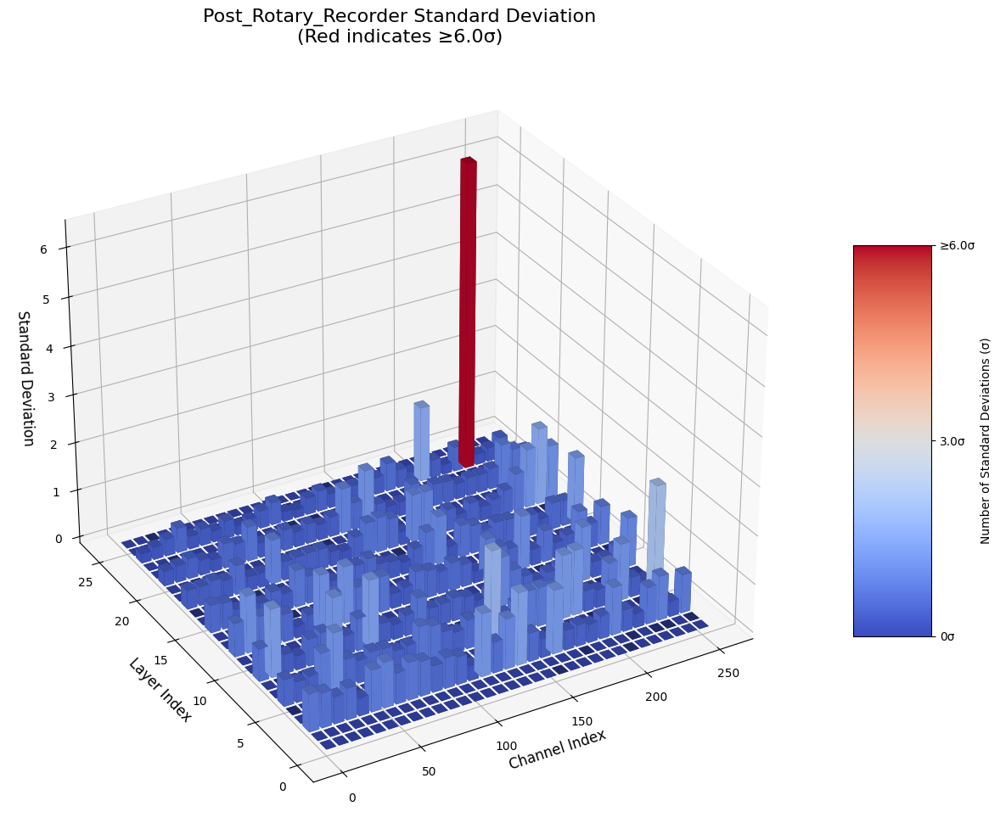


Processing attention_output_recorder_std_per_channel...


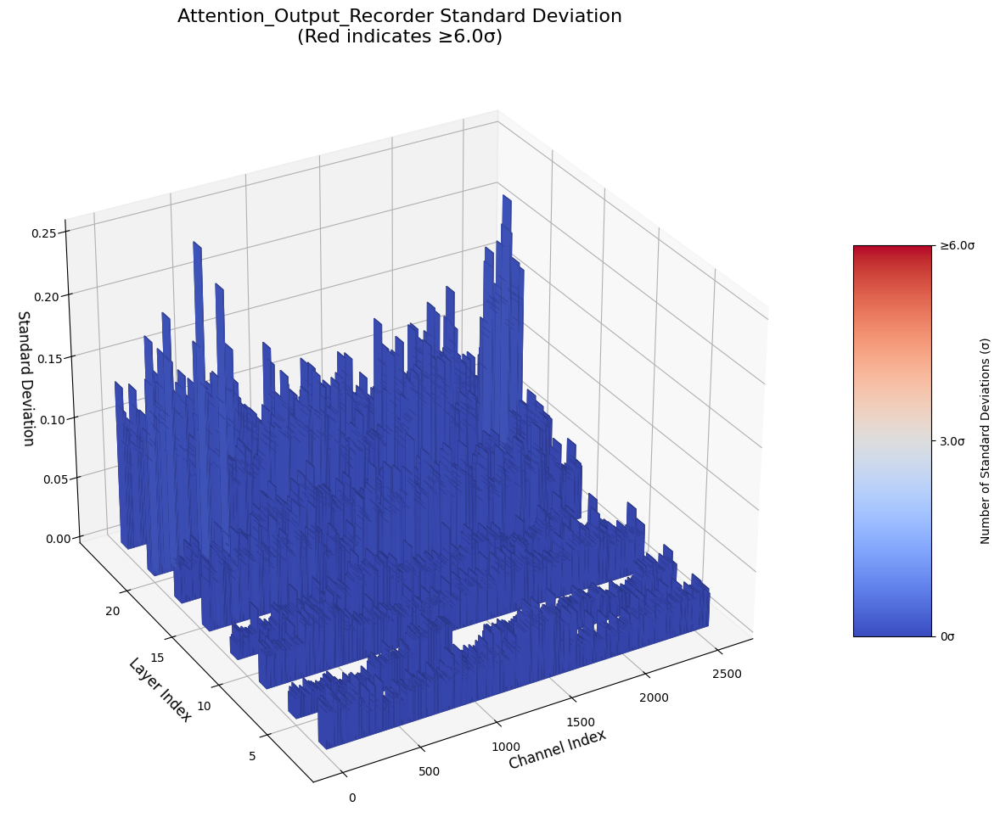


Processing rglru_norm_recorder_std_per_channel...


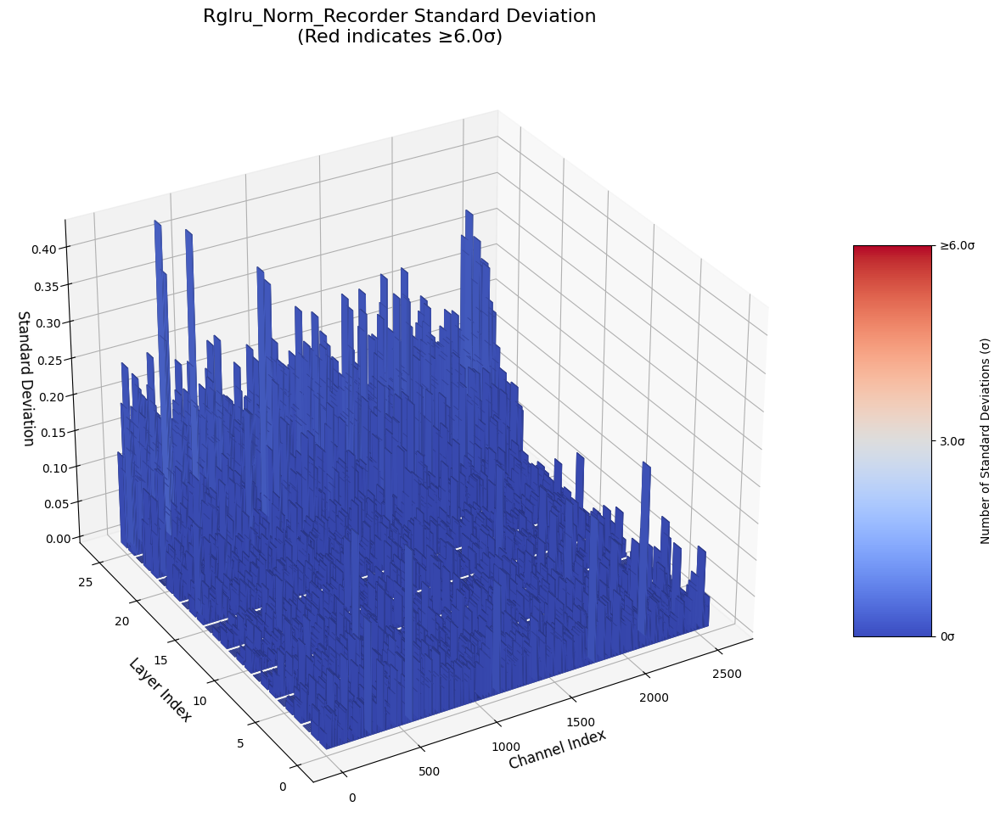


Processing mlp_up_recorder_std_per_channel...


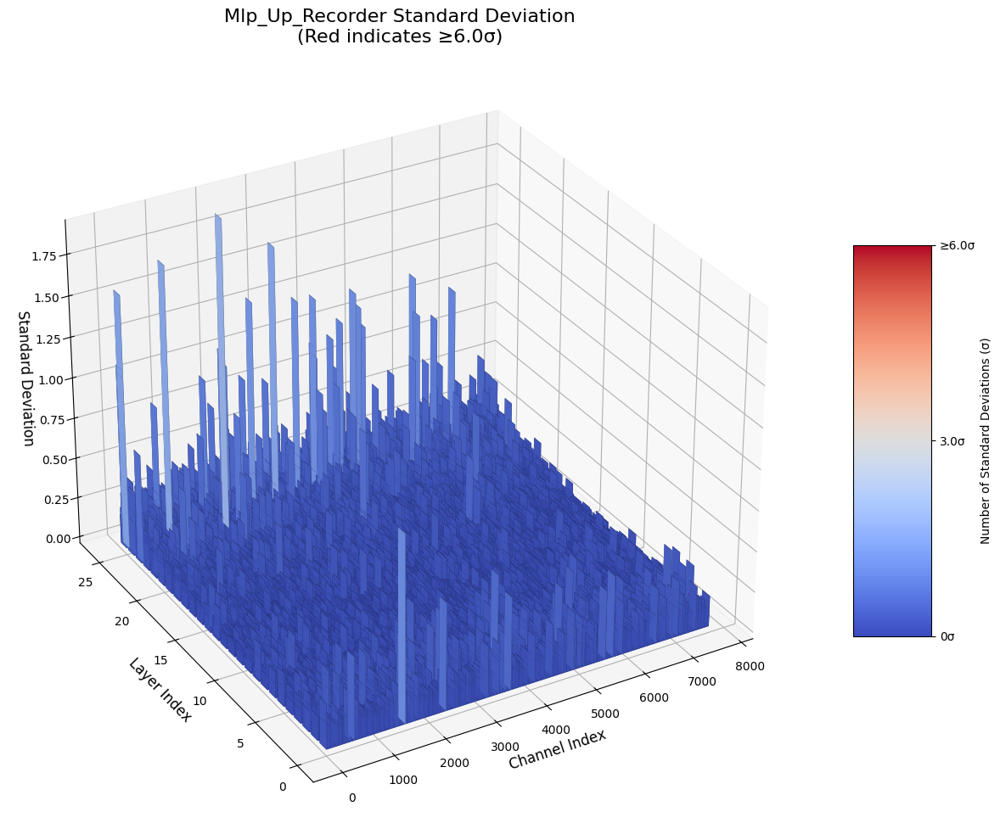


Processing recurrent_block_x_initial_recorder_std_per_channel...


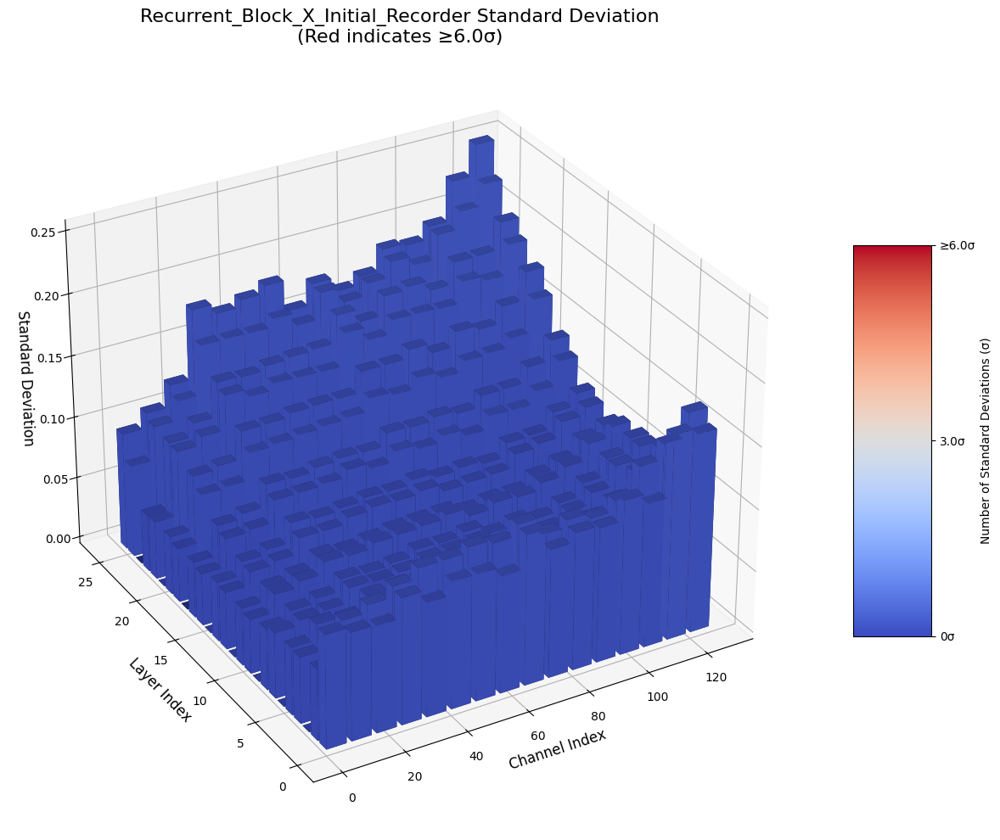


Processing key_recorder_std_per_channel...


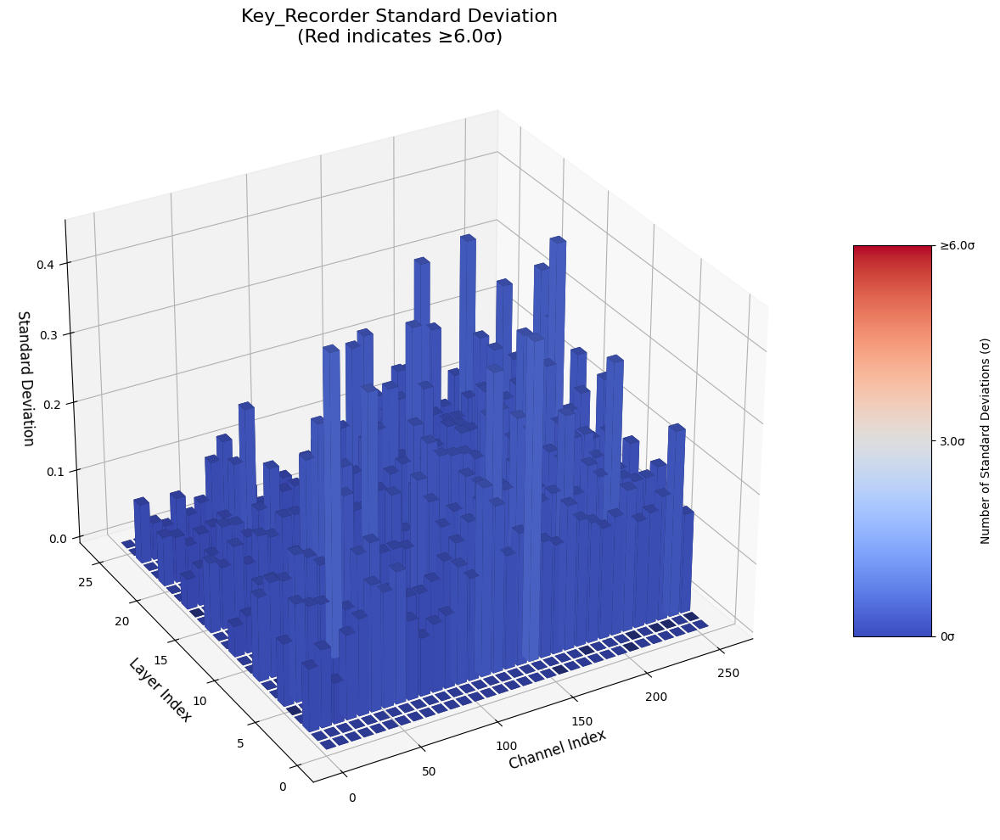


Processing recurrent_block_x_rglru_recorder_std_per_channel...


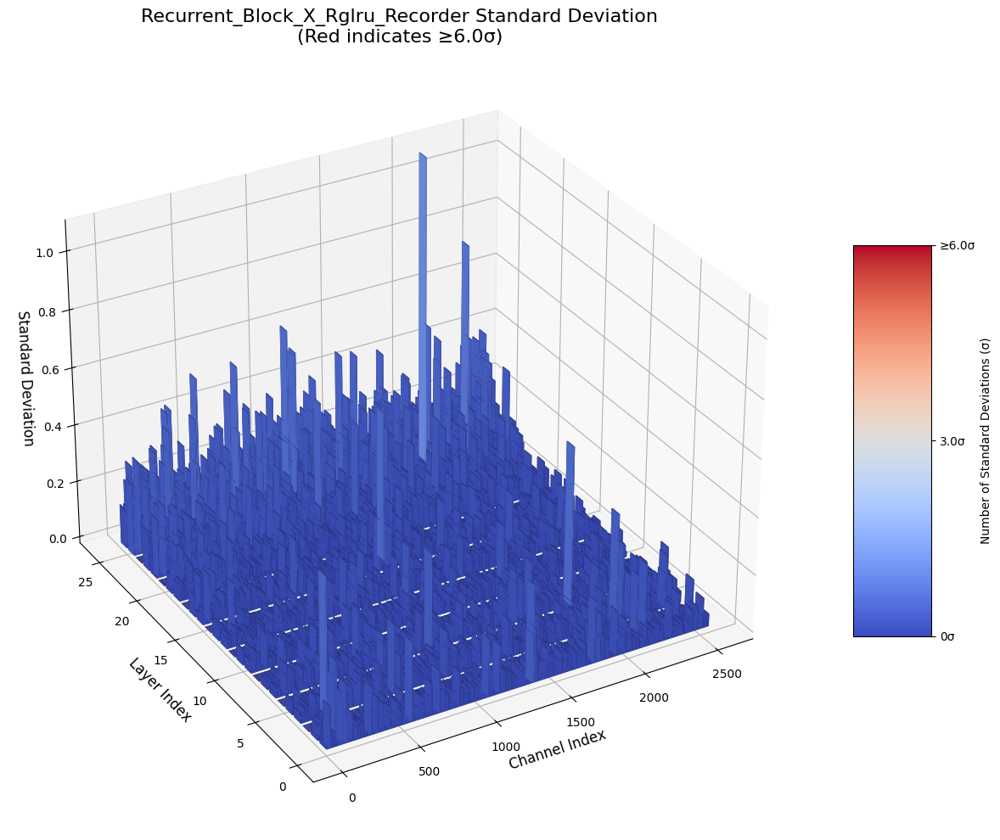


Processing mlp_gated_up_recorder_std_per_channel...


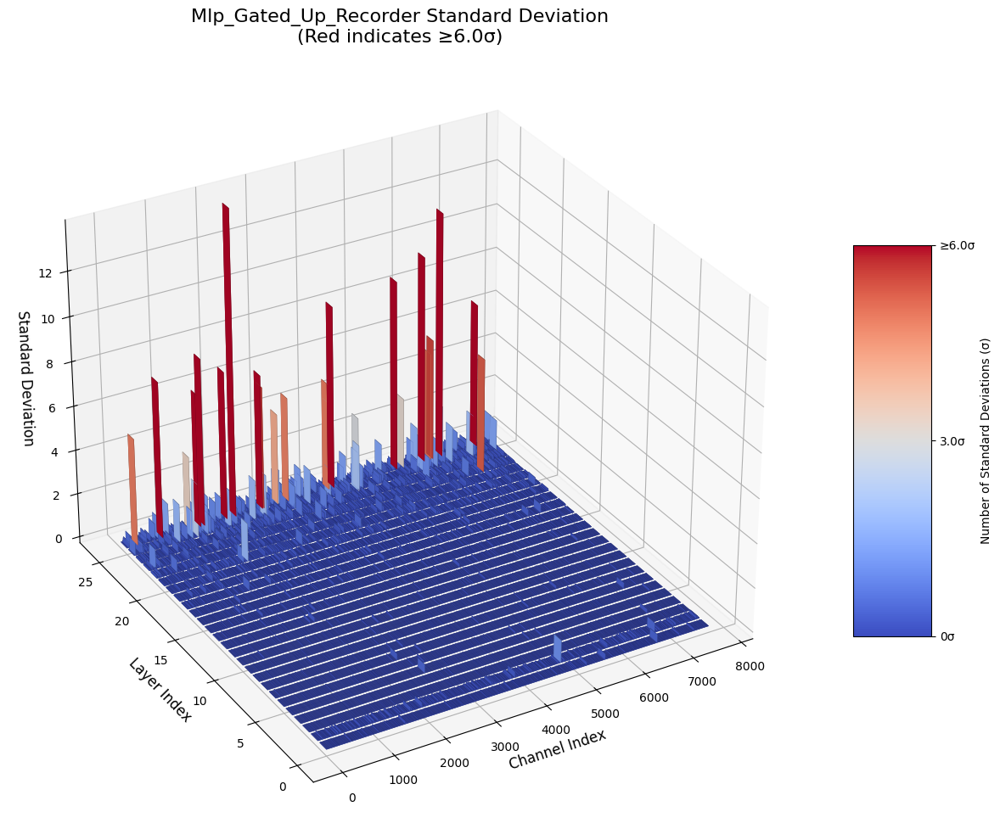


Processing rglru_gated_inputs_recorder_std_per_channel...


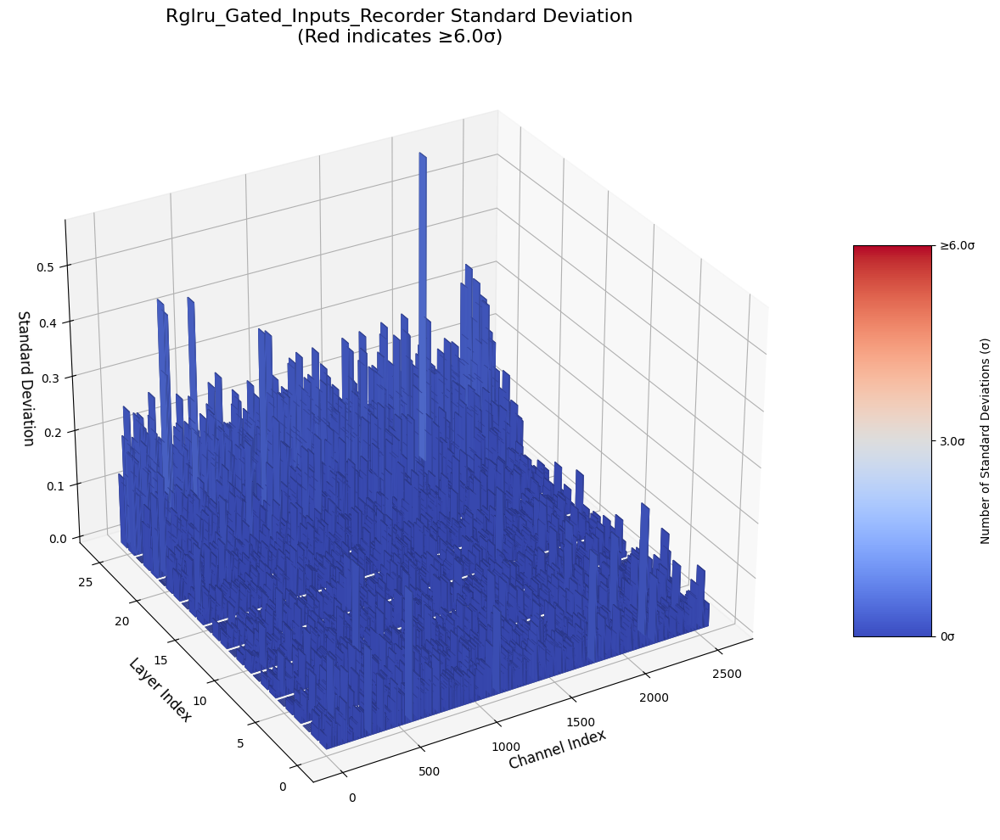


Processing recurrent_block_y_gate_recorder_std_per_channel...


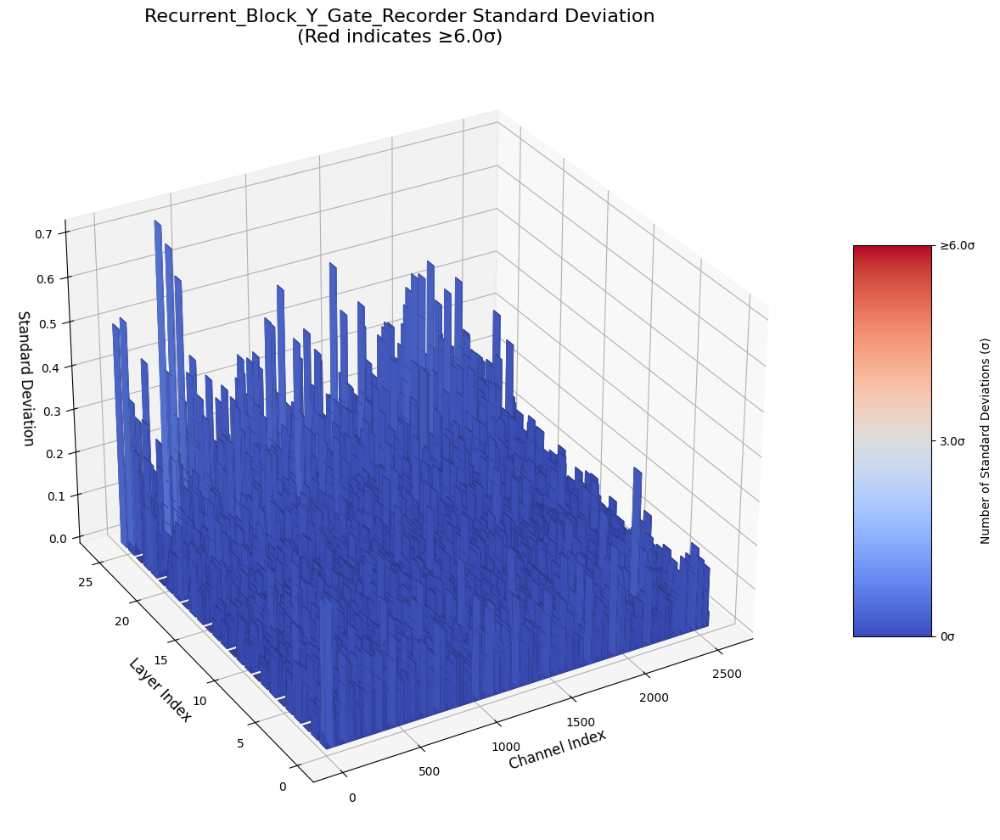


Processing temporal_std_per_channel...


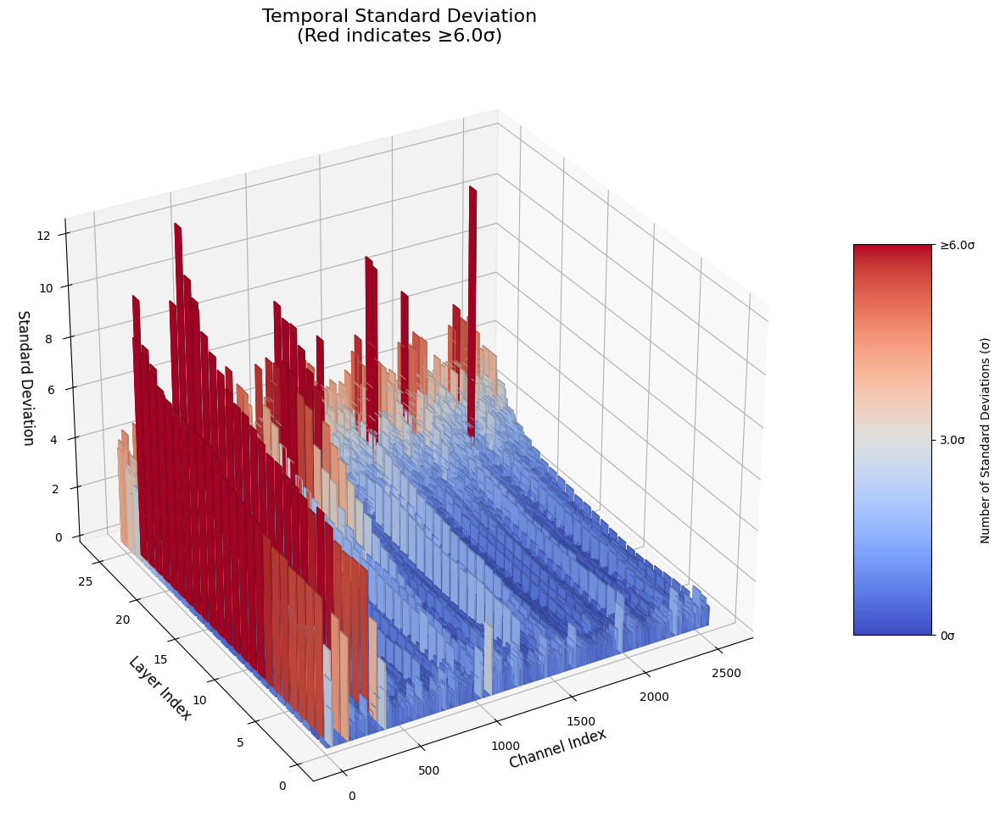


Processing recurrent_block_x_conv_recorder_std_per_channel...


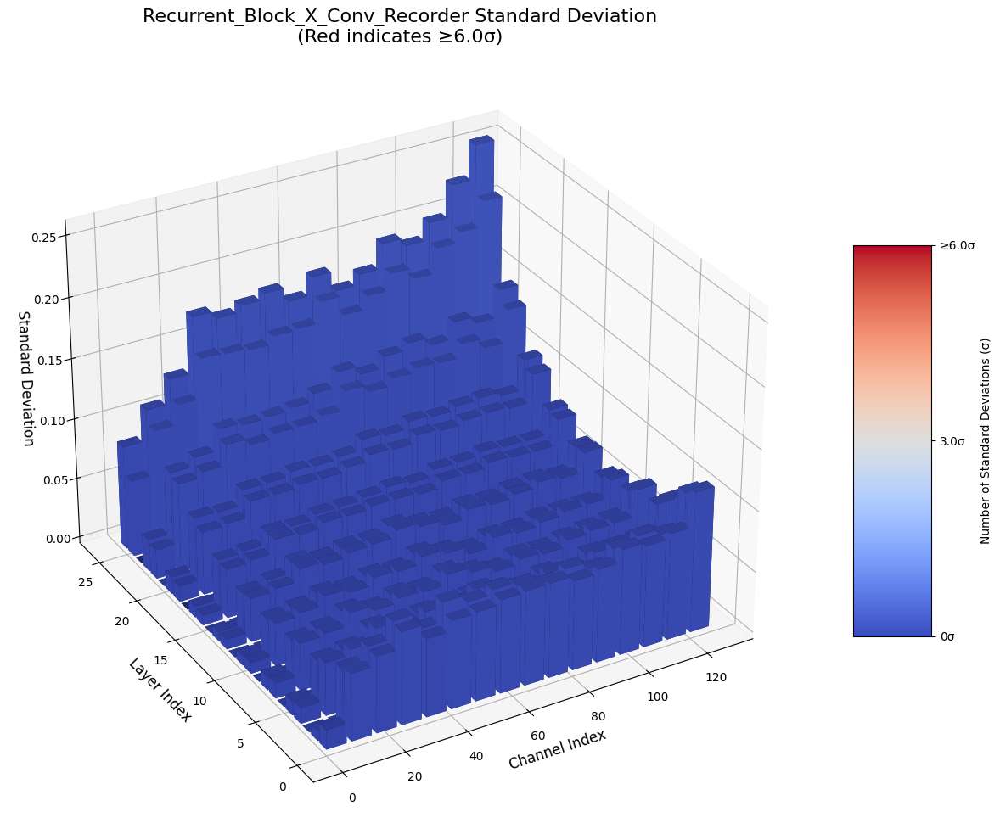


Processing mlp_gate_recorder_std_per_channel...


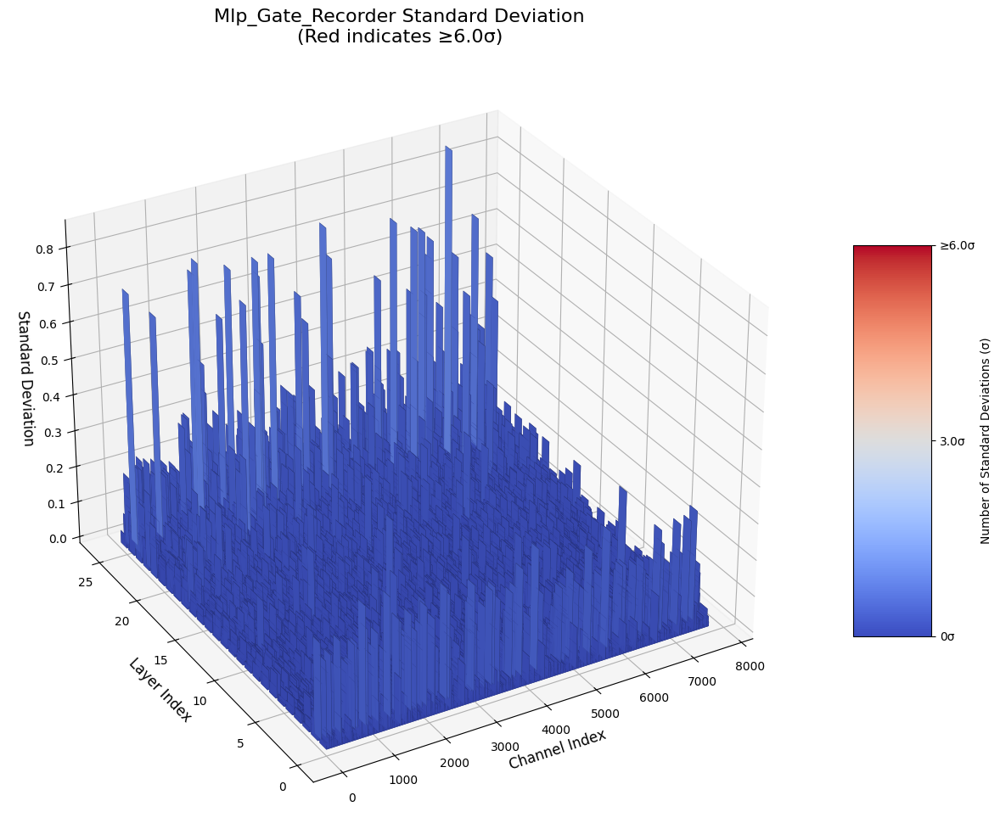


Processing rglru_input_gate_recorder_std_per_channel...


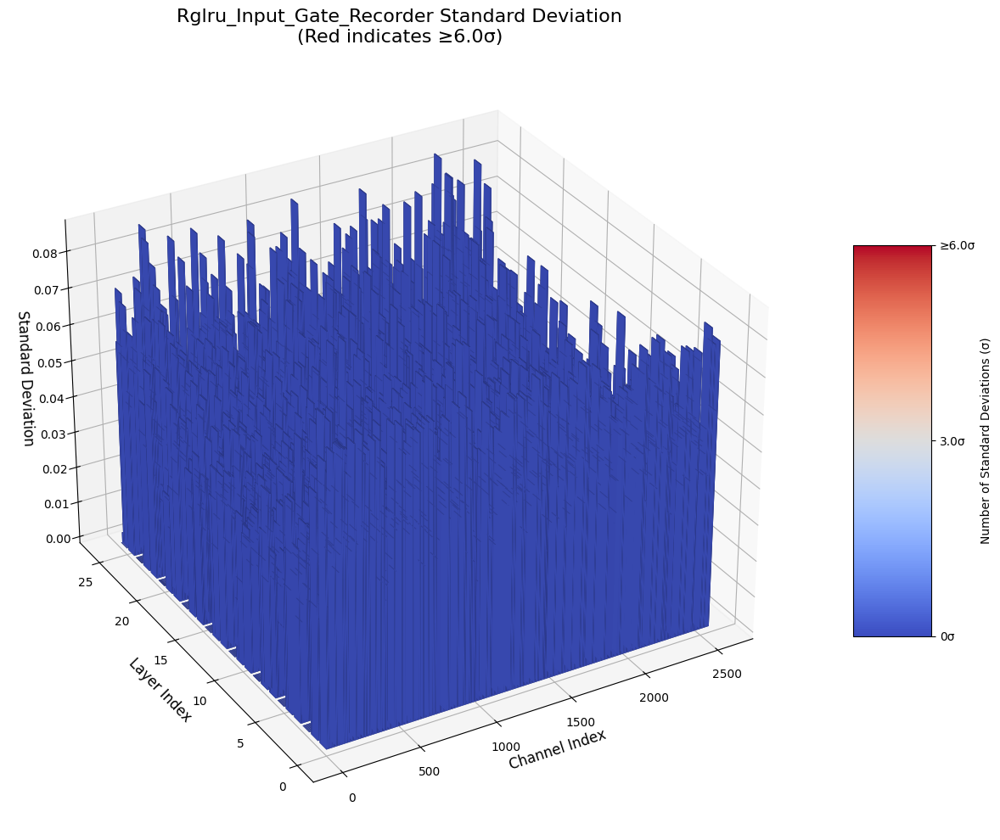


Processing final_output_recorder_std_per_channel...


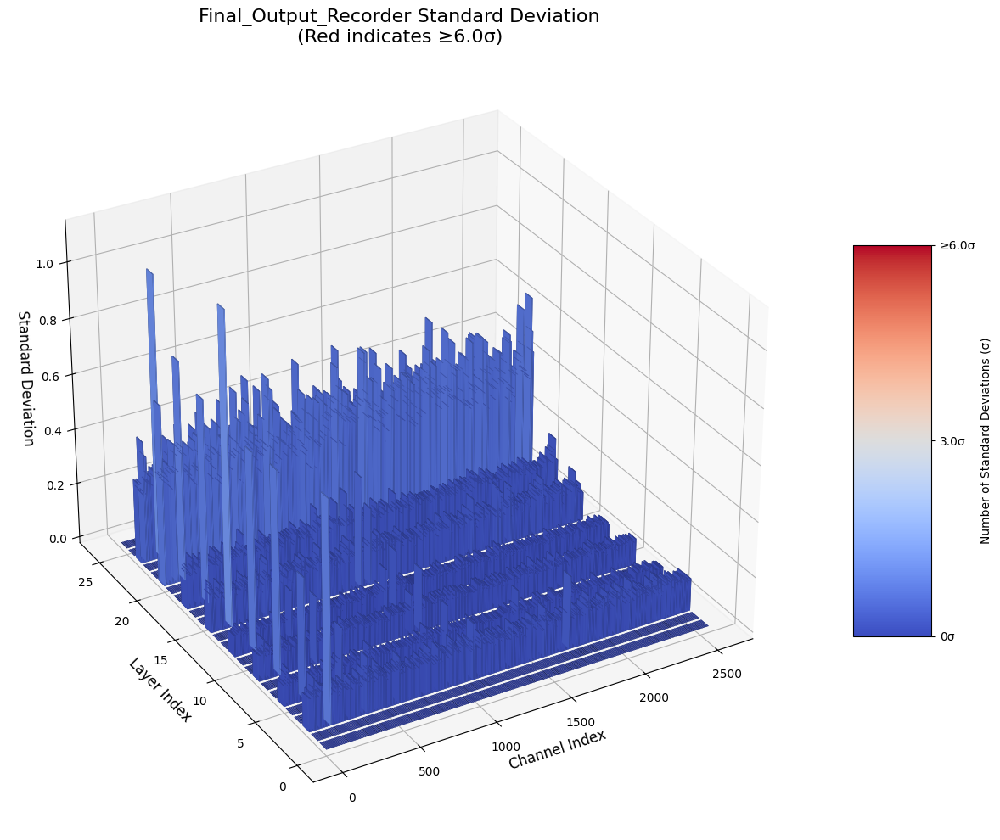


Processing recurrent_block_gated_recorder_std_per_channel...


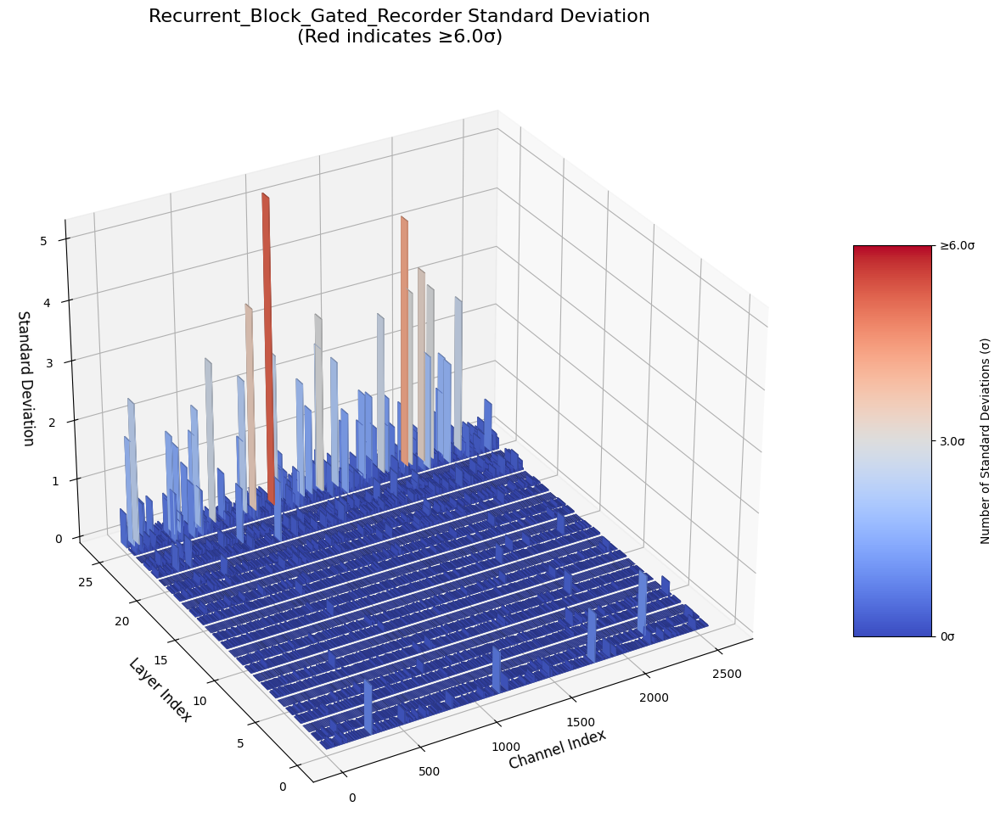


Processing mlp_output_recorder_std_per_channel...


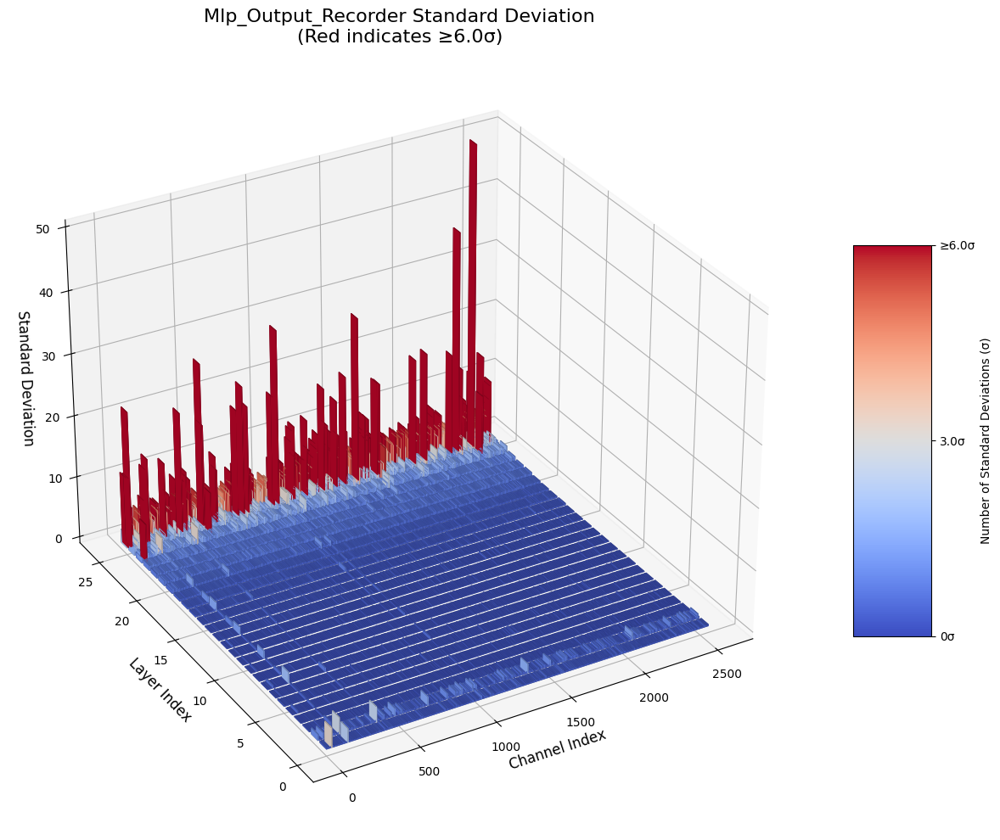


Processing channel_std_per_channel...


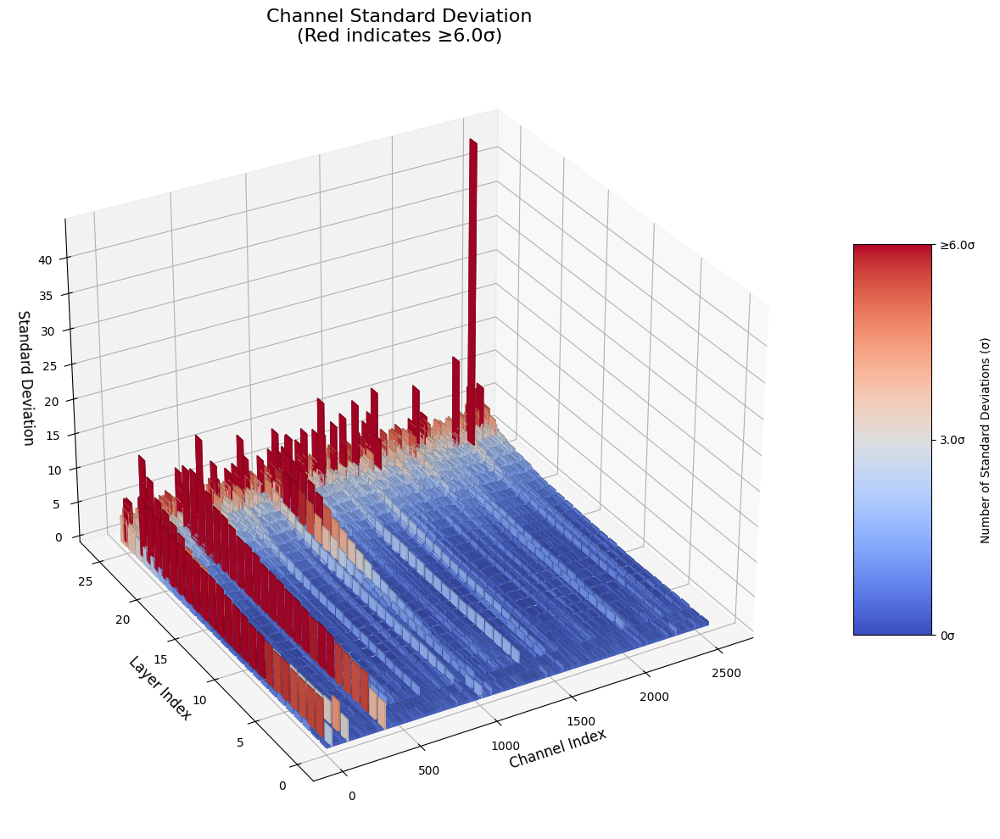


Processing query_recorder_std_per_channel...


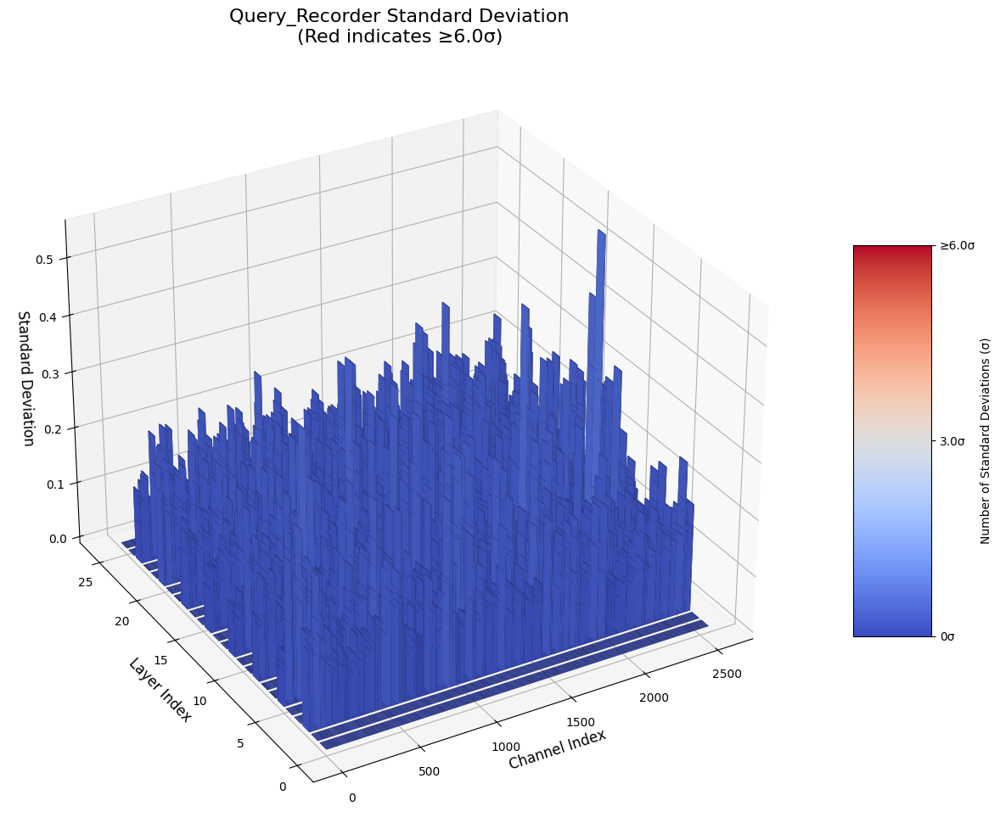


Processing rglru_scan_recorder_std_per_channel...


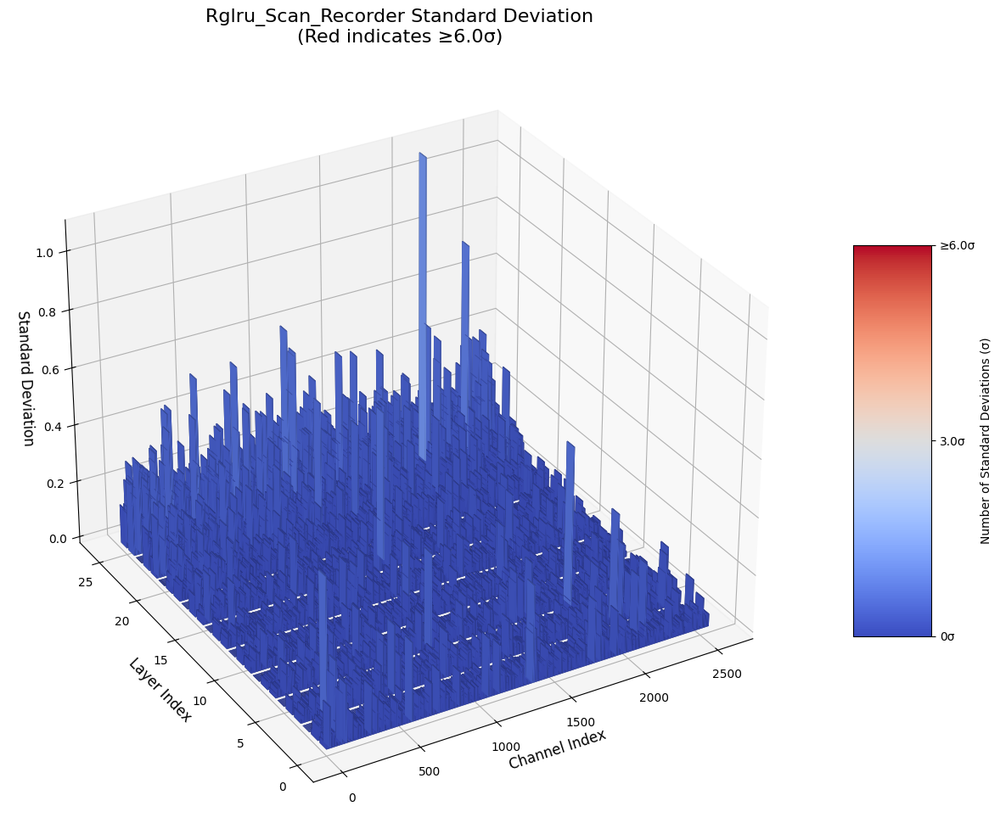


Processing attention_input_std_per_channel...


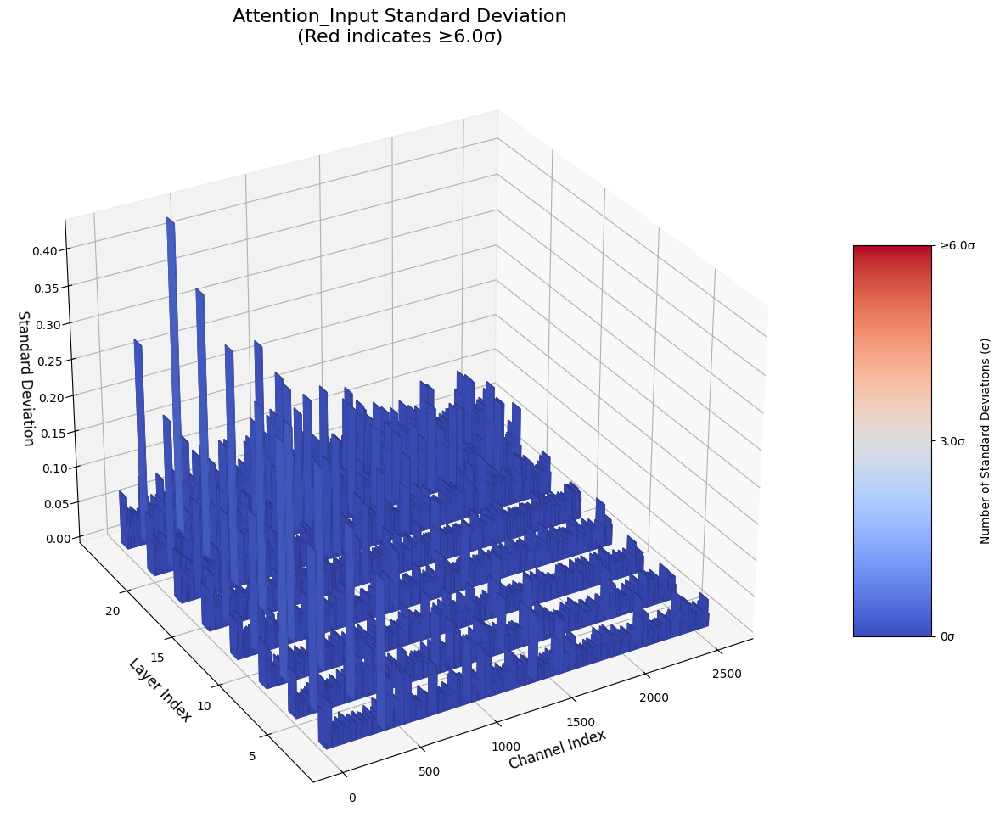


Processing mlp_input_recorder_std_per_channel...


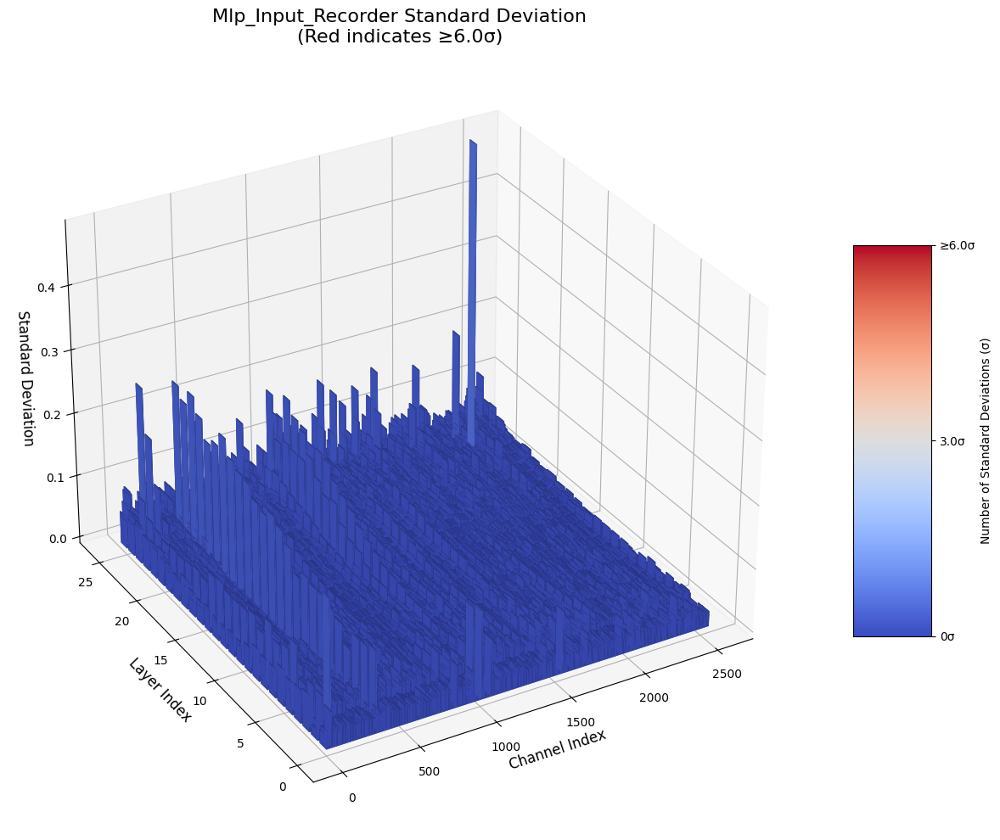


Processing rglru_recurrent_gate_recorder_std_per_channel...


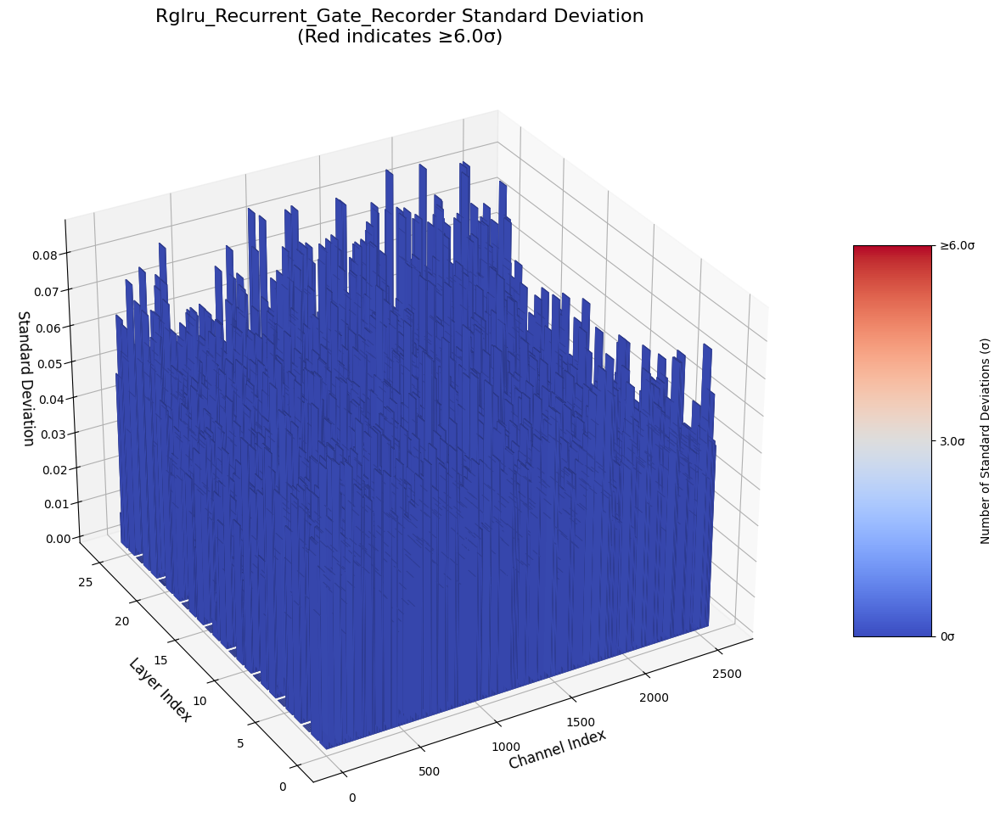


Processing recurrent_block_final_recorder_std_per_channel...


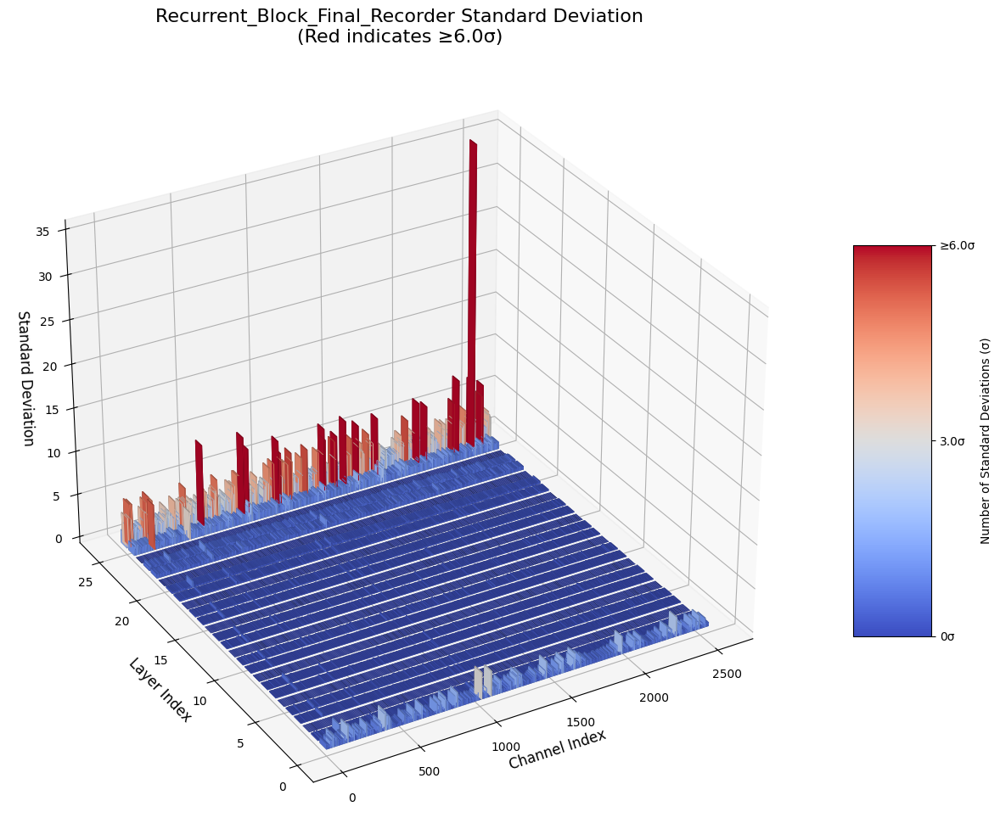

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

def plot_stats(all_stats, subsample_factor=8, std_threshold=6.0):
    print("Processing data...")

    # Determine shapes for each stat type
    stat_shapes = {}
    stat_types = set()
    num_layers = len(all_stats)
    num_batches = None

    for layer_idx in range(num_layers):
        layer_stats = all_stats[f'layer_{layer_idx}']
        for stat_type in layer_stats:
            if '_std_per_channel' in stat_type and layer_stats[stat_type]:
                if num_batches is None:
                    num_batches = len(layer_stats[stat_type])
                data_shape = np.array(layer_stats[stat_type][0]).shape
                if stat_type not in stat_shapes:
                    stat_shapes[stat_type] = data_shape
                stat_types.add(stat_type)

    stat_types = list(stat_types)
    print("\nFound shapes for each stat type:")
    for stat_type, shape in stat_shapes.items():
        print(f"{stat_type}: {shape}")

    # Process each stat type
    for stat_type in stat_types:
        print(f"\nProcessing {stat_type}...")
        output_size = stat_shapes[stat_type][-1]

        # Determine which layers have this stat
        if 'attention' in stat_type:
            valid_layers = [i for i in range(num_layers) if stat_type in all_stats[f'layer_{i}']]
            data = np.zeros((len(valid_layers), output_size))
            layer_indices = valid_layers
        else:
            data = np.zeros((num_layers, output_size))
            valid_layers = range(num_layers)
            layer_indices = range(num_layers)

        # Process data for each layer
        for idx, layer_idx in enumerate(valid_layers):
            if stat_type in all_stats[f'layer_{layer_idx}']:
                layer_data = []
                for batch_idx in range(num_batches):
                    if batch_idx < len(all_stats[f'layer_{layer_idx}'][stat_type]):
                        batch_data = np.array(all_stats[f'layer_{layer_idx}'][stat_type][batch_idx])
                        if len(batch_data.shape) == 3:  # For post_rotary shape
                            batch_data = np.mean(batch_data, axis=(0, 1))
                        else:
                            batch_data = np.mean(batch_data, axis=0)
                        layer_data.append(batch_data)

                if layer_data:
                    data[idx] = np.mean(layer_data, axis=0)

        # Create plot
        fig = plt.figure(figsize=(15, 10))
        ax = fig.add_subplot(111, projection='3d')

        # Subsample for visualization
        x_data = np.arange(0, output_size, subsample_factor)
        z_data = data[:, ::subsample_factor]

        X, Y = np.meshgrid(x_data, layer_indices)

        # Flatten arrays for bar3d
        x_flat = X.ravel()
        y_flat = Y.ravel()
        z_flat = z_data.ravel()

        # Color mapping based on number of standard deviations
        # Now directly using the value as the number of standard deviations
        color_values = np.abs(z_flat) / std_threshold  # Values of 1.0 will be red
        # Clip to ensure values don't exceed 1
        color_values = np.clip(color_values, 0, 1)
        colors = plt.cm.coolwarm(color_values)

        # Create bars
        dx = subsample_factor * 0.8
        dy = 0.8

        ax.bar3d(x_flat, y_flat, np.zeros_like(z_flat),
                dx, dy, z_flat,
                shade=True, color=colors)

        # Set labels and title
        name = stat_type.replace('_std_per_channel', '')
        ax.set_title(f'{name.title()} Standard Deviation\n(Red indicates ≥{std_threshold}σ)', fontsize=16)
        ax.set_xlabel('Channel Index', fontsize=12)
        ax.set_ylabel('Layer Index', fontsize=12)
        ax.set_zlabel('Standard Deviation', fontsize=12)

        # Set view
        ax.view_init(elev=30, azim=240)

        # Add colorbar with standard deviation scale
        norm = plt.Normalize(0, std_threshold)
        mappable = plt.cm.ScalarMappable(cmap='coolwarm', norm=norm)
        mappable.set_array([])
        cbar = plt.colorbar(mappable, ax=ax, shrink=0.5, aspect=5)
        cbar.set_label('Number of Standard Deviations (σ)', fontsize=10)

        # Add ticks to colorbar to show progression
        cbar.set_ticks([0, std_threshold/2, std_threshold])
        cbar.set_ticklabels(['0σ', f'{std_threshold/2}σ', f'≥{std_threshold}σ'])

        plt.tight_layout()
        plt.show()
        plt.close()

# Run the visualization
plot_stats(all_stats, subsample_factor=8, std_threshold=6.0)

In [ ]:
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt
from collections import defaultdict
import warnings
warnings.filterwarnings('ignore')  # Suppress scipy warnings

def robust_compute_stats(data):
    """
    Compute statistical measures with robust error handling and additional metrics.
    """
    flat_data = np.array(data).ravel()

    # Remove any inf or nan values
    valid_data = flat_data[np.isfinite(flat_data)]

    if len(valid_data) == 0:
        return {
            'mean': np.nan,
            'median': np.nan,
            'std': np.nan,
            'skew': np.nan,
            'kurt': np.nan,
            'iqr': np.nan,
            'range': np.nan,
            'valid_fraction': 0.0,
            'zeros_fraction': np.nan
        }

    try:
        percentiles = np.percentile(valid_data, [25, 50, 75])
        return {
            'mean': np.mean(valid_data),
            'median': percentiles[1],
            'std': np.std(valid_data),
            'skew': stats.skew(valid_data, nan_policy='omit'),
            'kurt': stats.kurtosis(valid_data, nan_policy='omit'),
            'iqr': percentiles[2] - percentiles[0],
            'range': np.max(valid_data) - np.min(valid_data),
            'valid_fraction': len(valid_data) / len(flat_data),
            'zeros_fraction': np.sum(valid_data == 0) / len(valid_data)
        }
    except Exception as e:
        print(f"Error computing statistics: {e}")
        return {key: np.nan for key in ['mean', 'median', 'std', 'skew', 'kurt', 'iqr', 'range', 'valid_fraction', 'zeros_fraction']}

def compare_components(all_stats, pairs_to_compare):
    """
    Enhanced comparison between components with robust statistics.
    """
    comparison_results = defaultdict(list)

    for layer_idx in range(len(all_stats)):
        layer_stats = all_stats[f'layer_{layer_idx}']

        for before_name, after_name in pairs_to_compare:
            before_key = f"{before_name}_std_per_channel"
            after_key = f"{after_name}_std_per_channel"

            if before_key not in layer_stats or after_key not in layer_stats:
                continue

            layer_results = {
                'layer': layer_idx,
                'batches': []
            }

            n_batches = min(len(layer_stats[before_key]), len(layer_stats[after_key]))
            for batch_idx in range(n_batches):
                before_data = layer_stats[before_key][batch_idx]
                after_data = layer_stats[after_key][batch_idx]

                # Compute robust statistics
                before_stats = robust_compute_stats(before_data)
                after_stats = robust_compute_stats(after_data)

                # Compute relative changes safely
                changes = {}
                for key in before_stats:
                    if key == 'valid_fraction' or key == 'zeros_fraction':
                        changes[f'{key}_before'] = before_stats[key]
                        changes[f'{key}_after'] = after_stats[key]
                    else:
                        if np.isfinite(before_stats[key]) and np.isfinite(after_stats[key]):
                            denominator = np.abs(before_stats[key]) if key in ['mean', 'median'] else before_stats[key]
                            if denominator != 0:
                                changes[f'{key}_change'] = (after_stats[key] - before_stats[key]) / denominator
                            else:
                                changes[f'{key}_change'] = after_stats[key] - before_stats[key]
                        else:
                            changes[f'{key}_change'] = np.nan

                layer_results['batches'].append(changes)

            # Average across batches
            if layer_results['batches']:
                avg_stats = {}
                for key in layer_results['batches'][0].keys():
                    values = [batch[key] for batch in layer_results['batches']]
                    avg_stats[key] = np.nanmean(values)
                layer_results.update(avg_stats)
                comparison_results[f"{before_name}_vs_{after_name}"].append(layer_results)

    return comparison_results

def analyze_nan_values(comparison_results):
    """
    Analyze and report on NaN values in the results.
    """
    print("\n=== NaN Analysis ===")
    for comparison, results in comparison_results.items():
        print(f"\n{comparison}:")

        # Collect all metrics
        metrics = [key for key in results[0].keys() if key != 'layer' and key != 'batches']

        for metric in metrics:
            values = [r[metric] for r in results]
            nan_count = np.sum(np.isnan(values))
            if nan_count > 0:
                print(f"\n{metric}:")
                print(f"  NaN count: {nan_count}/{len(values)} layers")
                print(f"  Layers with NaN: {[r['layer'] for i, r in enumerate(results) if np.isnan(values[i])]}")

                # For valid_fraction and zeros_fraction, analyze the distribution
                if 'fraction' in metric:
                    valid_values = [v for v in values if np.isfinite(v)]
                    if valid_values:
                        print(f"  Valid values mean: {np.mean(valid_values):.4f}")
                        print(f"  Valid values range: [{np.min(valid_values):.4f}, {np.max(valid_values):.4f}]")

def print_enhanced_summary(comparison_results):
    """
    Print comprehensive summary with additional statistical measures.
    """
    for comparison, results in comparison_results.items():
        print(f"\n=== {comparison} ===")

        metrics = [key for key in results[0].keys()
                  if key != 'layer' and key != 'batches' and '_change' in key]

        # Summary statistics
        print("\nRelative Changes (mean ± std):")
        for metric in metrics:
            values = [r[metric] for r in results]
            valid_values = [v for v in values if np.isfinite(v)]

            if valid_values:
                mean_change = np.mean(valid_values)
                std_change = np.std(valid_values)
                print(f"\n{metric}:")
                print(f"  Average: {mean_change:.4f} ± {std_change:.4f}")

                # Identify layers with minimal change
                threshold = np.percentile(np.abs(valid_values), 25)
                minimal_change_layers = [results[i]['layer'] for i in range(len(values))
                                       if np.isfinite(values[i]) and abs(values[i]) <= threshold]
                print(f"  Layers with minimal change (<{threshold:.4f}): {minimal_change_layers}")

                # Additional statistics
                print(f"  Median change: {np.median(valid_values):.4f}")
                print(f"  IQR: {np.percentile(valid_values, 75) - np.percentile(valid_values, 25):.4f}")

        # Data quality metrics
        print("\nData Quality Metrics:")
        for result in results:
            valid_before = result.get('valid_fraction_before', np.nan)
            valid_after = result.get('valid_fraction_after', np.nan)
            zeros_before = result.get('zeros_fraction_before', np.nan)
            zeros_after = result.get('zeros_fraction_after', np.nan)

            if np.isfinite(valid_before) and np.isfinite(valid_after):
                print(f"\nLayer {result['layer']}:")
                print(f"  Valid data fraction: {valid_before:.3f} → {valid_after:.3f}")
                print(f"  Zeros fraction: {zeros_before:.3f} → {zeros_after:.3f}")

# Example usage:
pairs_to_compare = [
    ('attention_input', 'key_recorder'),
    ('key_recorder', 'post_rotary_recorder'),
    ('post_rotary_recorder', 'attention_output_recorder')
]

# Run enhanced analysis
results = compare_components(all_stats, pairs_to_compare)

# Print comprehensive analysis
analyze_nan_values(results)
print_enhanced_summary(results)


=== NaN Analysis ===

attention_input_vs_key_recorder:

key_recorder_vs_post_rotary_recorder:

post_rotary_recorder_vs_attention_output_recorder:

=== attention_input_vs_key_recorder ===

Relative Changes (mean ± std):

mean_change:
  Average: 3.3420 ± 1.5344
  Layers with minimal change (<2.2169): [20, 23]
  Median change: 3.5056
  IQR: 2.4876

median_change:
  Average: 3.3459 ± 1.6214
  Layers with minimal change (<2.1427): [20, 23]
  Median change: 3.3307
  IQR: 2.6324

std_change:
  Average: 2.8442 ± 1.1212
  Layers with minimal change (<2.0807): [20, 23]
  Median change: 3.3562
  IQR: 1.6970

skew_change:
  Average: -0.6504 ± 0.1611
  Layers with minimal change (<0.5482): [20, 23]
  Median change: -0.6752
  IQR: 0.2442

kurt_change:
  Average: -0.8723 ± 0.1239
  Layers with minimal change (<0.8240): [20, 23]
  Median change: -0.9155
  IQR: 0.1529

iqr_change:
  Average: 3.9514 ± 1.6407
  Layers with minimal change (<2.9071): [20, 23]
  Median change: 4.3853
  IQR: 2.5316

range_c

In [ ]:
!pip install dash --ignore-installed blinker

  Using cached setuptools-75.6.0-py3-none-any.whl.metadata (6.7 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 63.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.7/101.7 kB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 19.1/19.1 MB 83.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 228.0/228.0 kB 14.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.9/64.9 kB 4.3 MB/s eta 0:00:00
Using cached setuptools-75.6.0-py3-none-any.whl (1.2 MB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 167.3/167.3 kB 11.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 144.8/144.8 kB 8.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 97.9/97.9 kB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.4/70.4 kB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.3/133.3 kB 8.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 126.3/126.3 kB 8.7 MB/s eta 0:00:00
   

In [ ]:
import dash
from dash import dcc, html
from dash.dependencies import Input, Output, State
import plotly.graph_objects as go
import numpy as np
from collections import defaultdict

class StatsVisualizer:
    def __init__(self, all_stats):
        self.app = dash.Dash(__name__)
        self.all_stats = all_stats
        self.num_layers = len(all_stats)

        # Updated component metrics to match exactly what's being collected
        self.component_metrics = {
                      'RMSNorm': [
                          'temporal_std_per_channel',
                          'channel_std_per_channel'
                      ],
                      'Attention': [
                          'attention_input_std_per_channel',
                          'query_recorder_std_per_channel',
                          'key_recorder_std_per_channel',
                          'post_rotary_recorder_std_per_channel',
                          'attention_output_recorder_std_per_channel',
                          'final_output_recorder_std_per_channel'
                      ],
                      'RGLRU': [
                          'rglru_input_gate_recorder_std_per_channel',
                          'rglru_recurrent_gate_recorder_std_per_channel',
                          'rglru_gated_inputs_recorder_std_per_channel',
                          'rglru_norm_recorder_std_per_channel',
                          'rglru_scan_recorder_std_per_channel'
                      ],
                      'RecurrentBlock': [
                          'recurrent_block_y_gate_recorder_std_per_channel',
                          'recurrent_block_x_initial_recorder_std_per_channel',
                          'recurrent_block_x_conv_recorder_std_per_channel',
                          'recurrent_block_x_rglru_recorder_std_per_channel',
                          'recurrent_block_gated_recorder_std_per_channel',
                          'recurrent_block_final_recorder_std_per_channel'
                      ],
                      'MLP': [
                        'mlp_input_recorder_std_per_channel',
                        'mlp_gate_recorder_std_per_channel',
                        'mlp_up_recorder_std_per_channel',
                        'mlp_gated_up_recorder_std_per_channel',
                        'mlp_output_recorder_std_per_channel'
]
                  }

        self._setup_layout()
        self._setup_callbacks()

    def _get_readable_name(self, metric):
        """Convert metric name to readable format"""
        name = metric.replace('_std_per_channel', '')
        name = name.replace('_recorder', '')
        name = name.replace('_', ' ')
        return name.title()

    def _setup_layout(self):
        self.app.layout = html.Div([
            html.H1('Model Statistics Visualizer',
                   style={'textAlign': 'center', 'marginBottom': 30}),

            # Controls container
            html.Div([
                # Component type selection
                html.Div([
                    html.Label('Component Type:', className='font-bold'),
                    dcc.Dropdown(
                        id='component-selector',
                        options=[{'label': comp, 'value': comp}
                                for comp in self.component_metrics.keys()],
                        value=list(self.component_metrics.keys())[0],
                        clearable=False
                    )
                ], style={'marginBottom': 20, 'width': '300px'}),

                # Metric selection for selected component
                html.Div([
                    html.Label('Metric:', className='font-bold'),
                    dcc.Dropdown(
                        id='metric-selector',
                        options=[],  # Will be populated based on component selection
                        value=None,
                        clearable=False
                    )
                ], style={'marginBottom': 20, 'width': '500px'}),

                # Standard deviation threshold slider
                html.Div([
                    html.Label('Standard Deviation Threshold (σ):', className='font-bold'),
                    dcc.Slider(
                        id='std-threshold-slider',
                        min=0,
                        max=12,
                        step=0.1,
                        value=6.0,
                        marks={i: f'{i}σ' for i in range(0, 13, 2)},
                        tooltip={'placement': 'bottom', 'always_visible': True}
                    )
                ], style={'marginBottom': 20, 'width': '500px'}),

                # Subsample factor slider
                html.Div([
                    html.Label('Subsample Factor:', className='font-bold'),
                    dcc.Slider(
                        id='subsample-slider',
                        min=1,
                        max=32,
                        step=1,
                        value=8,
                        marks={i: str(i) for i in [1, 4, 8, 16, 32]},
                        tooltip={'placement': 'bottom', 'always_visible': True}
                    )
                ], style={'marginBottom': 20, 'width': '500px'})
            ], style={'padding': '20px', 'backgroundColor': '#f8f9fa', 'borderRadius': '10px'}),

            # Graph container
            html.Div([
                dcc.Graph(id='stats-3d-plot', style={'height': '800px'})
            ], style={'marginTop': 30})
        ], style={'padding': '20px', 'maxWidth': '1400px', 'margin': 'auto'})

    def _setup_callbacks(self):
        @self.app.callback(
            Output('metric-selector', 'options'),
            Output('metric-selector', 'value'),
            [Input('component-selector', 'value')]
        )
        def update_metrics(selected_component):
            if not selected_component:
                return [], None

            metrics = self.component_metrics[selected_component]
            options = [{'label': self._get_readable_name(m),
                       'value': m} for m in metrics]

            return options, metrics[0]

        @self.app.callback(
            Output('stats-3d-plot', 'figure'),
            [Input('metric-selector', 'value'),
             Input('std-threshold-slider', 'value'),
             Input('subsample-slider', 'value')]
        )
        def update_graph(selected_metric, std_threshold, subsample_factor):
            if not selected_metric:
                return go.Figure()

            # Process data
            data = []
            valid_layers = []

            for layer_idx in range(self.num_layers):
                layer_stats = self.all_stats[f'layer_{layer_idx}']

                if selected_metric in layer_stats and layer_stats[selected_metric]:
                    valid_layers.append(layer_idx)

                    layer_data = []
                    for batch_data in layer_stats[selected_metric]:
                        batch_data = np.array(batch_data)
                        if len(batch_data.shape) == 3:  # For post_rotary shape
                            batch_data = np.mean(batch_data, axis=(0, 1))
                        else:
                            batch_data = np.mean(batch_data, axis=0)
                        layer_data.append(batch_data)

                    if layer_data:
                        data.append(np.mean(layer_data, axis=0))

            if not data:
                return go.Figure()

            data = np.array(data)
            output_size = data.shape[1]

            # Subsample data
            x_data = np.arange(0, output_size, subsample_factor)
            z_data = data[:, ::subsample_factor]

            # Create meshgrid for the surface plot
            X, Y = np.meshgrid(x_data, valid_layers)

            # Create the 3D surface plot
            fig = go.Figure(data=[
                go.Surface(
                    x=X,
                    y=Y,
                    z=z_data,
                    colorscale=[
                        [0, 'rgb(220,220,220)'],      # Light gray for low values
                        [0.5, 'rgb(65,105,225)'],     # Royal blue for medium values
                        [1, 'rgb(139,0,0)']           # Dark red for high values
                    ],
                    cmin=0,
                    cmax=std_threshold,
                    colorbar=dict(
                        title='σ',
                        titleside='right',
                        ticksuffix='σ'
                    )
                )
            ])

            # Update layout
            metric_name = self._get_readable_name(selected_metric)
            fig.update_layout(
                title=dict(
                    text=f'{metric_name} Standard Deviation',
                    x=0.5,
                    y=0.95,
                    font=dict(size=20)
                ),
                scene=dict(
                    xaxis_title='Channel Index',
                    yaxis_title='Layer Index',
                    zaxis_title='Standard Deviation (σ)',
                    camera=dict(
                        eye=dict(x=2, y=2, z=1.5),
                        center=dict(x=0, y=0, z=0)
                    ),
                    aspectratio=dict(x=1.5, y=1, z=0.7)
                ),
                margin=dict(l=0, r=0, b=0, t=40)
            )

            return fig

    def run_server(self, debug=True, port=8050):
        self.app.run_server(debug=debug, port=port)

# Example usage:
if __name__ == '__main__':
    # Assuming all_stats is your existing stats dictionary
    visualizer = StatsVisualizer(all_stats)
    visualizer.run_server()

<IPython.core.display.Javascript object>

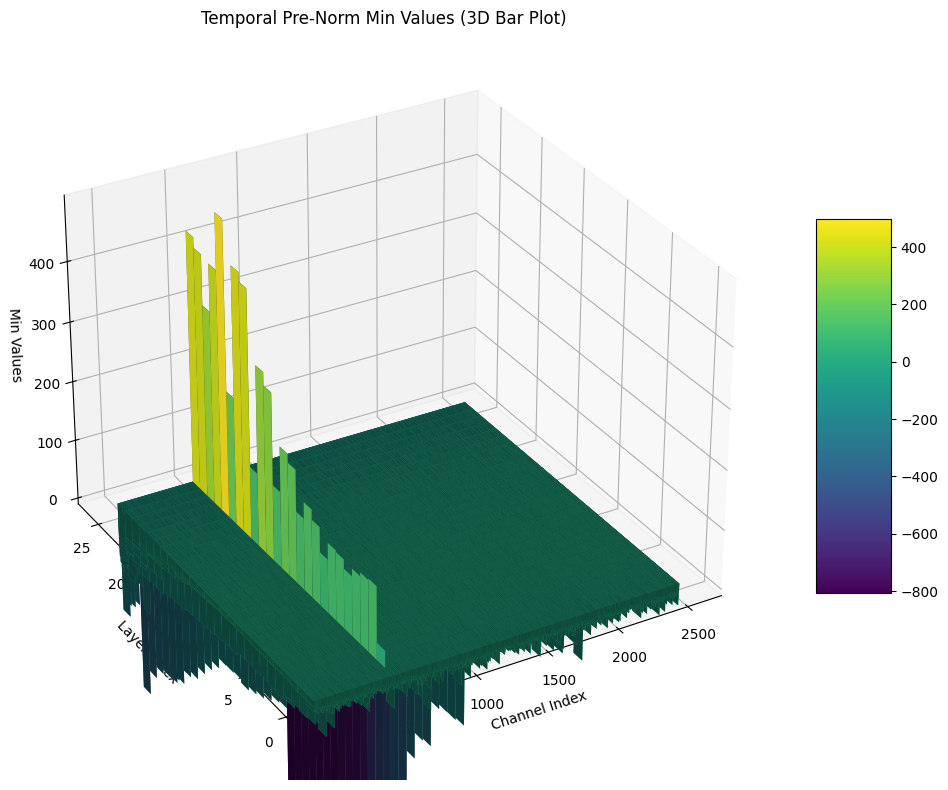

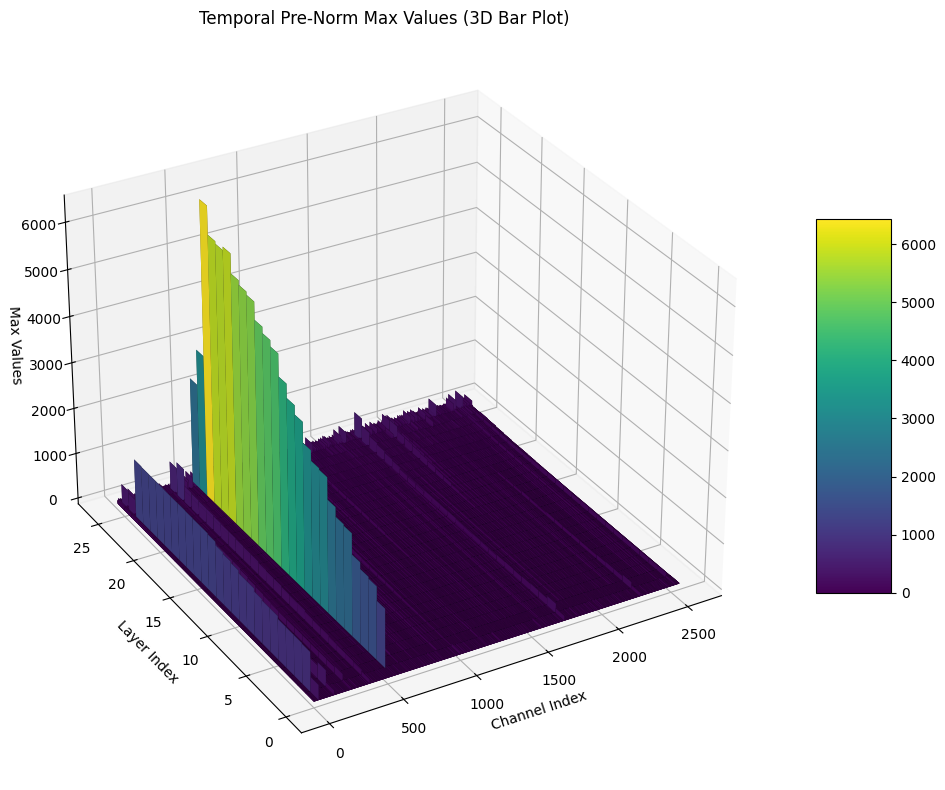

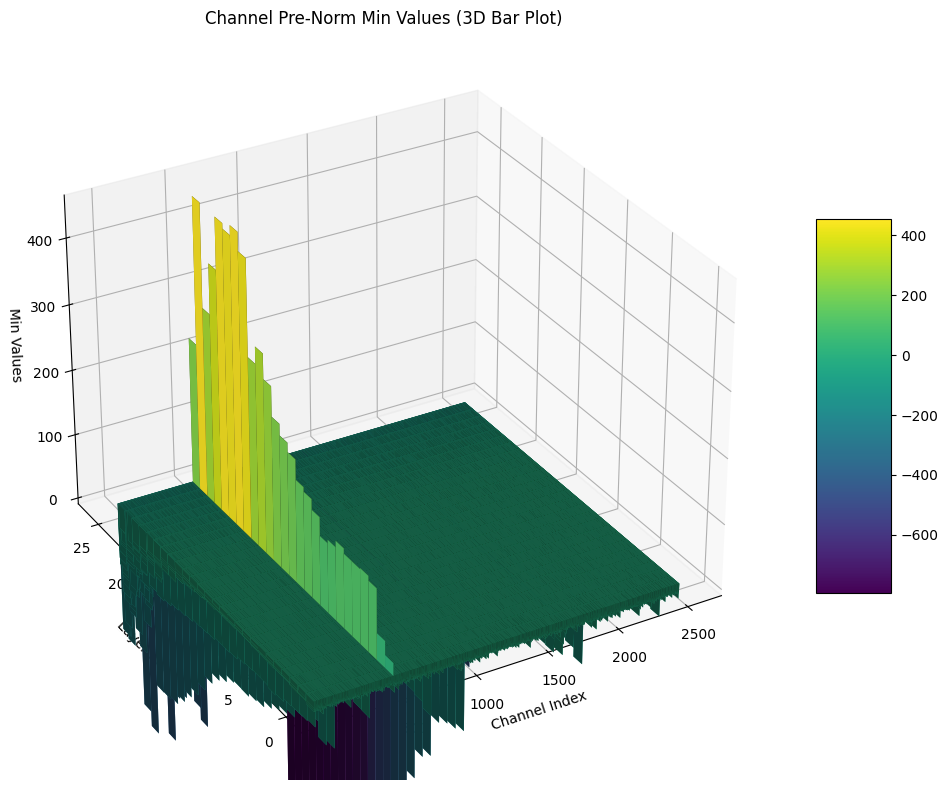

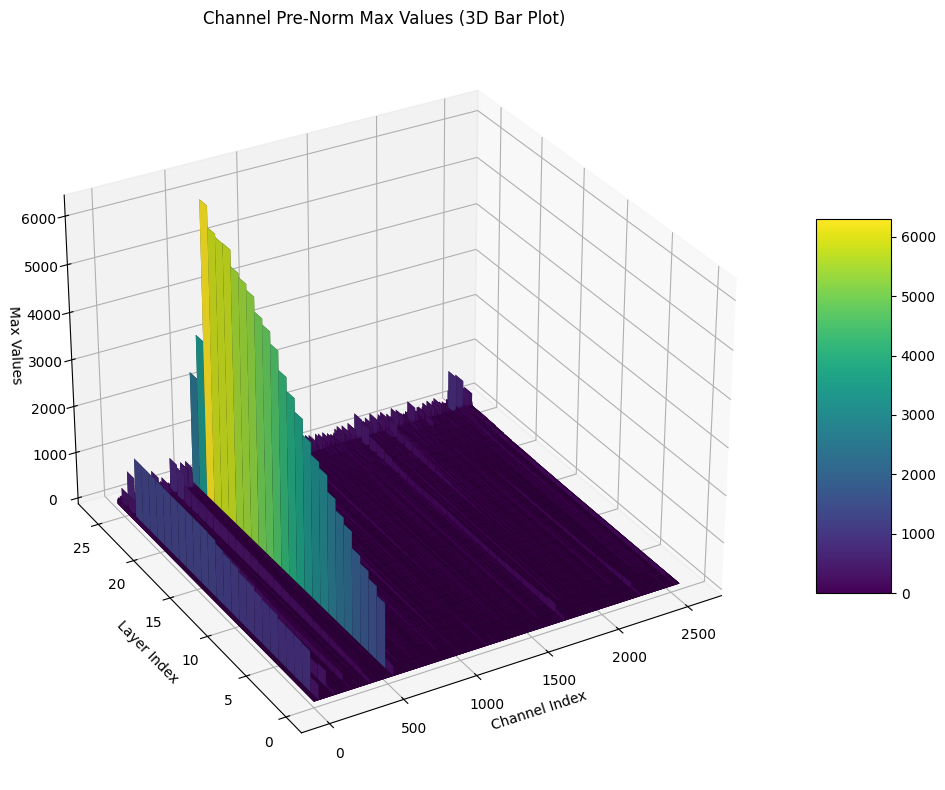

In [ ]:
# Prepare data for plotting min/max statistics
temporal_min_z_data = np.zeros((num_layers, num_batches, num_channels))
temporal_max_z_data = np.zeros((num_layers, num_batches, num_channels))
channel_min_z_data = np.zeros((num_layers, num_batches, num_channels))
channel_max_z_data = np.zeros((num_layers, num_batches, num_channels))

# Extract min and max values per layer and batch
for layer_idx in range(num_layers):
    for batch_idx in range(num_batches):
        # Temporal stats
        temporal_min_z_data[layer_idx, batch_idx, :] = all_stats[f'layer_{layer_idx}']['temporal_min_per_channel'][batch_idx]
        temporal_max_z_data[layer_idx, batch_idx, :] = all_stats[f'layer_{layer_idx}']['temporal_max_per_channel'][batch_idx]

        # Channel stats
        channel_min_z_data[layer_idx, batch_idx, :] = all_stats[f'layer_{layer_idx}']['channel_min_per_channel'][batch_idx]
        channel_max_z_data[layer_idx, batch_idx, :] = all_stats[f'layer_{layer_idx}']['channel_max_per_channel'][batch_idx]

# Average min and max values across batches for plotting
average_temporal_min_z_data = np.mean(temporal_min_z_data, axis=1)
average_temporal_max_z_data = np.mean(temporal_max_z_data, axis=1)
average_channel_min_z_data = np.mean(channel_min_z_data, axis=1)
average_channel_max_z_data = np.mean(channel_max_z_data, axis=1)

# X axis: Number of Channels, Y axis: Layer Index, Z axis: Min/Max Values
x_data = np.arange(num_channels)
y_data = np.arange(num_layers)

# Function to create a plot for min or max values
def create_min_max_3d_plot(z_data, title, z_label):
    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')
    X, Y = np.meshgrid(x_data, y_data)
    Z = np.array(z_data)

    x_flat = X.ravel()
    y_flat = Y.ravel()
    z_flat = Z.ravel()

    # Normalize z values for color mapping
    norm = plt.Normalize(z_flat.min(), z_flat.max())
    color_values = norm(z_flat)
    colors = plt.cm.viridis(color_values)

    # Creating a bar plot for each point in the meshgrid
    ax.bar3d(x_flat, y_flat, np.zeros_like(z_flat), 1, 1, z_flat, shade=True, color=colors)
    ax.set_title(title)
    ax.set_xlabel('Channel Index')
    ax.set_ylabel('Layer Index')
    ax.set_zlabel(z_label)
    ax.view_init(elev=30., azim=240)

    # Adding a color bar to reflect the mapping from color to height
    mappable = plt.cm.ScalarMappable(cmap='viridis', norm=norm)
    mappable.set_array(z_flat)
    fig.colorbar(mappable, ax=ax, shrink=0.5, aspect=5)
    plt.tight_layout()
    plt.show()

# Temporal pre-norm plots
create_min_max_3d_plot(
    average_temporal_min_z_data,
    title='Temporal Pre-Norm Min Values (3D Bar Plot)',
    z_label='Min Values'
)

create_min_max_3d_plot(
    average_temporal_max_z_data,
    title='Temporal Pre-Norm Max Values (3D Bar Plot)',
    z_label='Max Values'
)

# Channel pre-norm plots
create_min_max_3d_plot(
    average_channel_min_z_data,
    title='Channel Pre-Norm Min Values (3D Bar Plot)',
    z_label='Min Values'
)

create_min_max_3d_plot(
    average_channel_max_z_data,
    title='Channel Pre-Norm Max Values (3D Bar Plot)',
    z_label='Max Values'
)


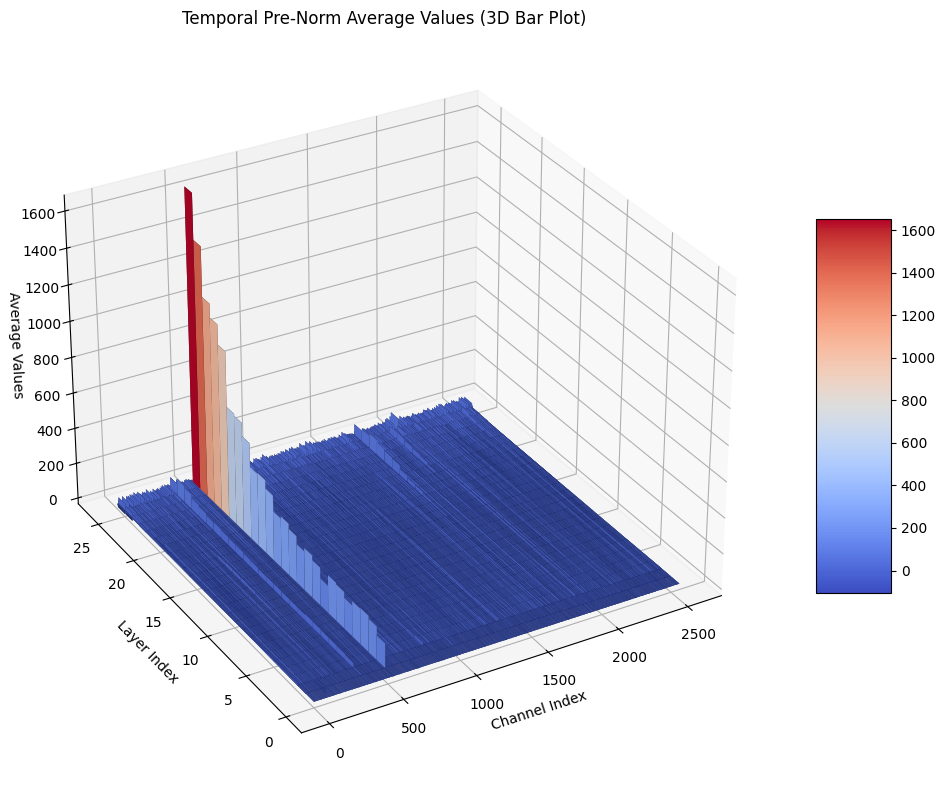

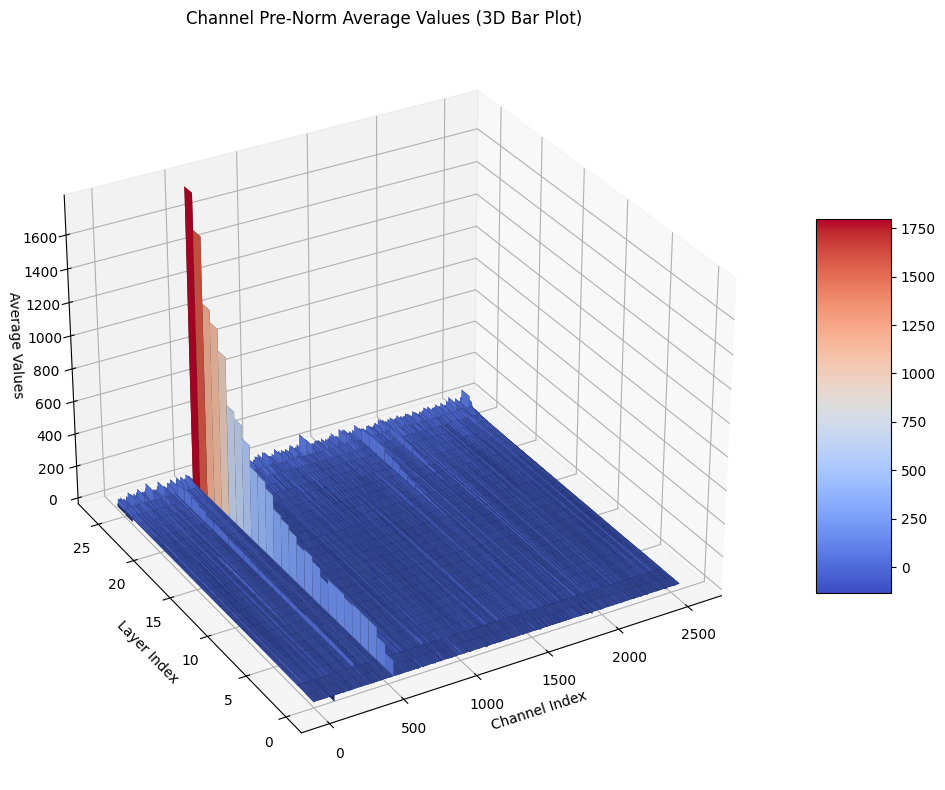

In [ ]:
# Prepare data for plotting mean statistics
temporal_mean_z_data = np.zeros((num_layers, num_batches, num_channels))
channel_mean_z_data = np.zeros((num_layers, num_batches, num_channels))

# Extract mean values per layer and batch
for layer_idx in range(num_layers):
    for batch_idx in range(num_batches):
        # Temporal stats
        temporal_mean_z_data[layer_idx, batch_idx, :] = all_stats[f'layer_{layer_idx}']['temporal_mean_per_channel'][batch_idx]

        # Channel stats
        channel_mean_z_data[layer_idx, batch_idx, :] = all_stats[f'layer_{layer_idx}']['channel_mean_per_channel'][batch_idx]

# Average mean values across batches for plotting
average_temporal_mean_z_data = np.mean(temporal_mean_z_data, axis=1)
average_channel_mean_z_data = np.mean(channel_mean_z_data, axis=1)

# X axis: Number of Channels, Y axis: Layer Index, Z axis: Average Values
x_data = np.arange(num_channels)
y_data = np.arange(num_layers)

# Function to create a plot for mean values
def create_mean_3d_plot(z_data, title, z_label):
    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')
    X, Y = np.meshgrid(x_data, y_data)
    Z = np.array(z_data)

    x_flat = X.ravel()
    y_flat = Y.ravel()
    z_flat = Z.ravel()

    # Normalize z values for color mapping
    norm = plt.Normalize(z_flat.min(), z_flat.max())
    color_values = norm(z_flat)
    colors = plt.cm.coolwarm(color_values)

    # Creating a bar plot for each point in the meshgrid
    ax.bar3d(x_flat, y_flat, np.zeros_like(z_flat), 1, 1, z_flat, shade=True, color=colors)
    ax.set_title(title)
    ax.set_xlabel('Channel Index')
    ax.set_ylabel('Layer Index')
    ax.set_zlabel(z_label)
    ax.view_init(elev=30., azim=240)

    # Adding a color bar to reflect the mapping from color to height
    mappable = plt.cm.ScalarMappable(cmap='coolwarm', norm=norm)
    mappable.set_array(z_flat)
    fig.colorbar(mappable, ax=ax, shrink=0.5, aspect=5)
    plt.tight_layout()
    plt.show()

# Temporal pre-norm average plot
create_mean_3d_plot(
    average_temporal_mean_z_data,
    title='Temporal Pre-Norm Average Values (3D Bar Plot)',
    z_label='Average Values'
)

# Channel pre-norm average plot
create_mean_3d_plot(
    average_channel_mean_z_data,
    title='Channel Pre-Norm Average Values (3D Bar Plot)',
    z_label='Average Values'
)


In [ ]:
\
# Calculate and print number of outliers and non-outliers
outliers_count = 0
non_outliers_count = 0
threshold = 6

for layer in channel_z_data + temporal_z_data:
    for value in layer:
        if value > threshold or value < -threshold:
            outliers_count += 1
        else:
            non_outliers_count += 1

print(f"Number of outliers (above {threshold}x std or below -{threshold}x std): {outliers_count}")
print(f"Number of non-outliers (within +/- {threshold}x std): {non_outliers_count}")

Number of outliers (above 6x std or below -6x std): 546
Number of non-outliers (within +/- 6x std): 132574


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


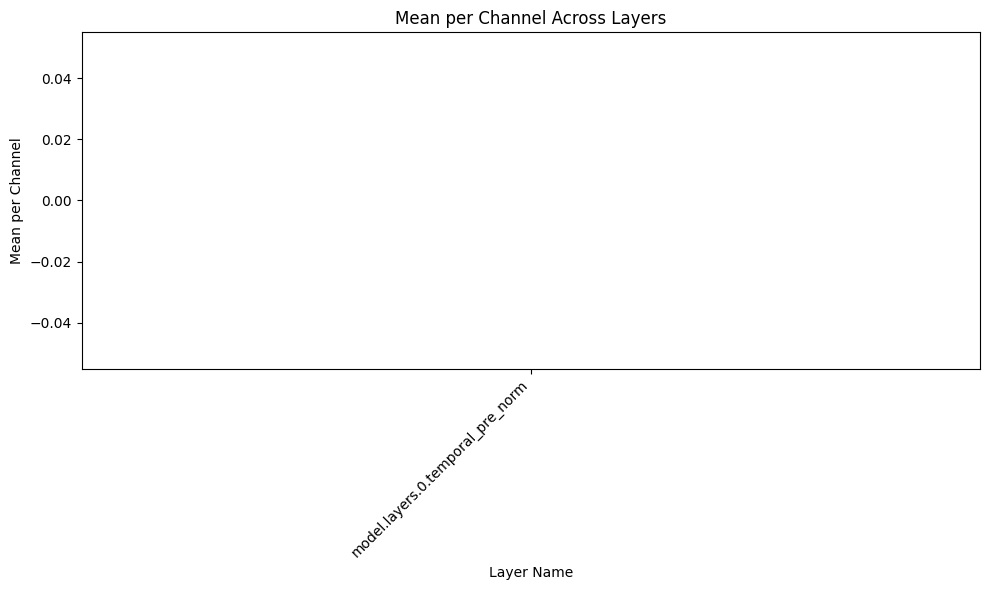

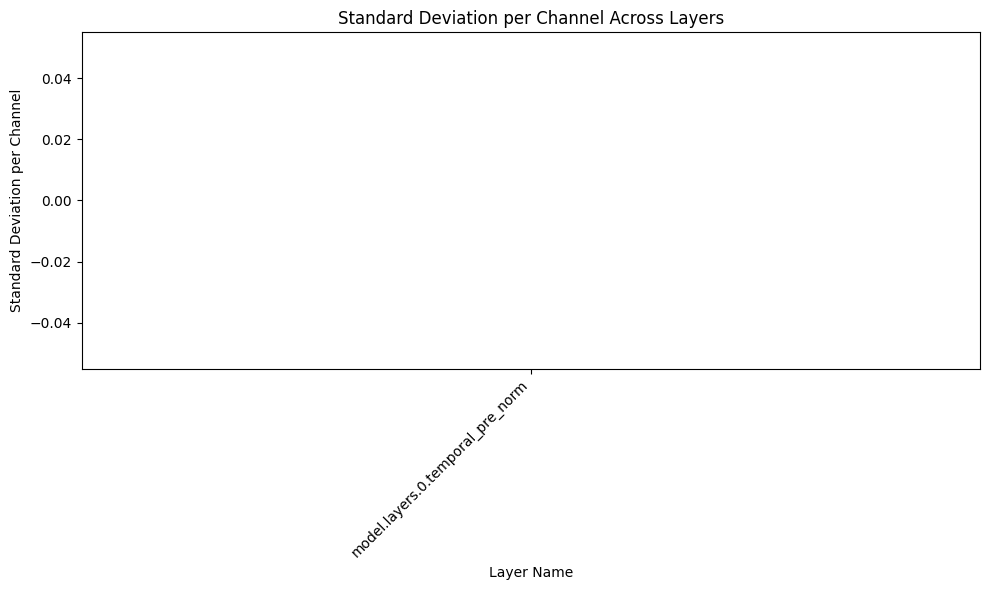

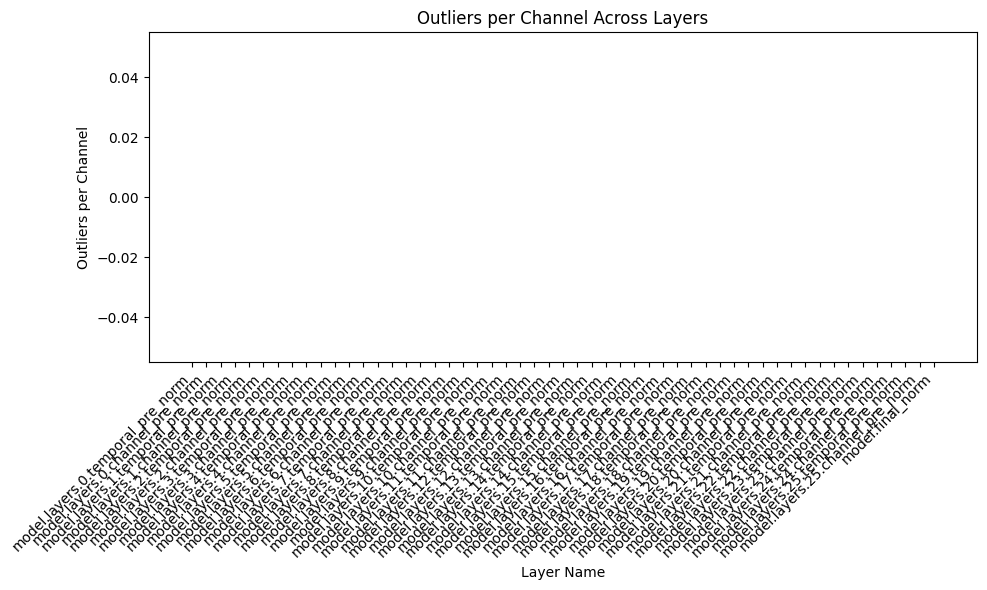

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Convert all_stats into a DataFrame for easier manipulation
layer_names = []
means = []
stds = []
outliers = []

# Loop over all accumulated stats in the dictionary
for layer_name, stats in all_stats.items():
    mean_per_channel_agg = []
    std_per_channel_agg = []
    outliers_per_channel_agg = []

    # Loop over the list of stats for eac ch layer
    for batch_idx in range(len(stats['mean_per_channel'])):
        mean_per_channel_agg.append(np.mean(stats['mean_per_channel'][batch_idx]))
        std_per_channel_agg.append(np.mean(stats['std_per_channel'][batch_idx]))
        outliers_per_channel_agg.append(np.sum(stats['outliers_per_channel'][batch_idx]))

    # Append aggregated stats to lists
    layer_names.append(layer_name)
    means.append(np.mean(mean_per_channel_agg))  # Average across batches for this layer
    stds.append(np.mean(std_per_channel_agg))  # Average std across batches
    outliers.append(np.sum(outliers_per_channel_agg))  # Total outliers across batches

# Create a DataFrame for easier plotting
df_stats = pd.DataFrame({
    'Layer': layer_names,
    'Mean per Channel': means,
    'Std per Channel': stds,
    'Outliers per Channel': outliers
})

print(outliers)  # Print outliers for verification

# Plot Mean per Channel
plt.figure(figsize=(10, 6))
plt.plot(df_stats['Layer'], df_stats['Mean per Channel'], marker='o', label='Mean per Channel')
plt.xticks(rotation=45, ha="right")
plt.xlabel('Layer Name')
plt.ylabel('Mean per Channel')
plt.title('Mean per Channel Across Layers')
plt.tight_layout()
plt.show()

# Plot Std per Channel
plt.figure(figsize=(10, 6))
plt.plot(df_stats['Layer'], df_stats['Std per Channel'], marker='o', label='Std per Channel', color='orange')
plt.xticks(rotation=45, ha="right")
plt.xlabel('Layer Name')
plt.ylabel('Standard Deviation per Channel')
plt.title('Standard Deviation per Channel Across Layers')
plt.tight_layout()
plt.show()

# Plot Outliers per Channel
plt.figure(figsize=(10, 6))
plt.bar(df_stats['Layer'], df_stats['Outliers per Channel'], color='green')
plt.xticks(rotation=45, ha="right")
plt.xlabel('Layer Name')
plt.ylabel('Outliers per Channel')
plt.title('Outliers per Channel Across Layers')
plt.tight_layout()
plt.show()


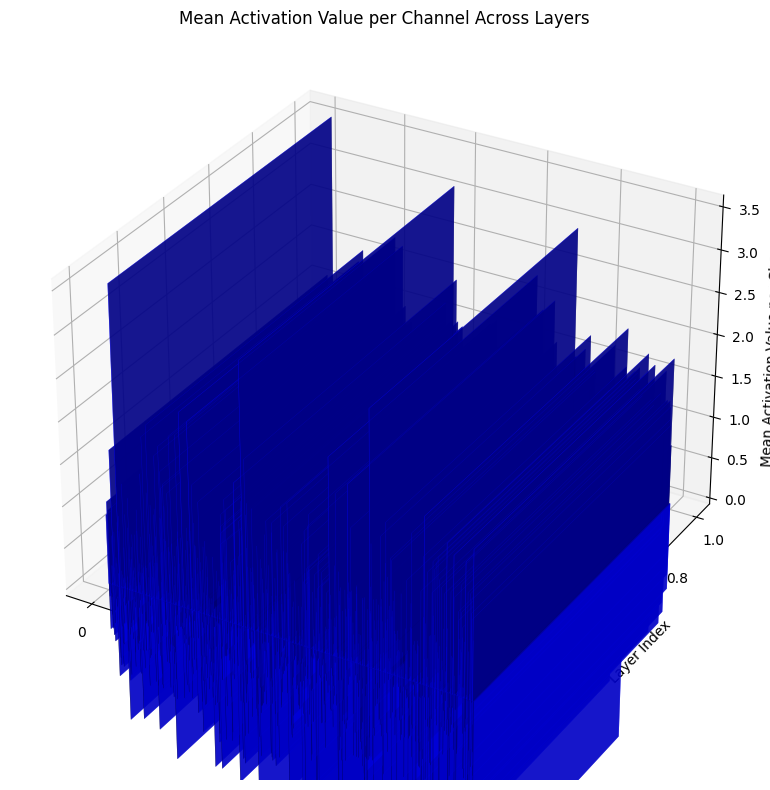

In [ ]:
sample_size = 1000  # Adjust this to a manageable size
xpos_sample = xpos[:sample_size]
ypos_sample = ypos[:sample_size]
dz_sample = dz[:sample_size]

# Create the 3D plot with fewer points
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Define bar sizes
dx = np.ones_like(xpos_sample)
dy = np.ones_like(ypos_sample)
zpos = np.zeros_like(dz_sample)

# Plot 3D bars
ax.bar3d(xpos_sample, ypos_sample, zpos, dx, dy, dz_sample, color='b', alpha=0.7)

# Labeling and formatting
ax.set_xlabel('Channel #')
ax.set_ylabel('Layer Index')
ax.set_zlabel('Mean Activation Value per Channel')
ax.set_title('Mean Activation Value per Channel Across Layers')

plt.tight_layout()
plt.show()
